# Data preparation by using WARN paper's method

In [1]:
# Import necessary libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from record import Record, create_record


METADATA_PATH = "../metadata.csv"
RECORDS_PATH = "../Records"

metadata_df = pd.read_csv(METADATA_PATH)

In IRIDIA-AF dataset, some of the record start with AF event, have very short AF and some of the records come from same patient.

To ensure we have a better quality data, the record are filtered.


In [2]:
from concurrent.futures import ThreadPoolExecutor

# Function to process each record
def evaluate_af_conditions(record_id):
    print(f"Processing record ID: {record_id}")
    record = create_record(record_id, metadata_df, RECORDS_PATH)
    record.load_ecg()
    result = {
        "start_with_af": False, 
        "af_less_10min": False, 
        "af_onset_less_90min": False,
        "one_record_only": len(record.ecg_files) == 1,
        "one_af_event": len(record.ecg_labels_df) == 1,
        "record_id": record_id
    }
    if (record.ecg_labels_df['start_qrs_index'][0] < 10000):
        result["start_with_af"] = True
    if (record.ecg_labels_df['af_duration'] < 600).any():
        result["af_less_10min"] = True
    if (record.ecg_labels_df['nsr_before_duration'] < 60*90).any():
        result["af_onset_less_90min"] = True
    return result


with ThreadPoolExecutor() as executor:
    results = list(executor.map(evaluate_af_conditions, metadata_df['record_id']))

# Save the results to npy files
np.save("save_files/af_filter_flags.npy", np.array(results))

Processing record ID: record_000
Processing record ID: record_001
Processing record ID: record_002
Processing record ID: record_003
Processing record ID: record_004
Processing record ID: record_005
Processing record ID: record_006
Processing record ID: record_007
Processing record ID: record_008
Processing record ID: record_009
Processing record ID: record_010
Processing record ID: record_011
Processing record ID: record_012
Processing record ID: record_013
Processing record ID: record_014
Processing record ID: record_015
Processing record ID: record_016
Processing record ID: record_017
Processing record ID: record_018
Processing record ID: record_019
Processing record ID: record_020
Processing record ID: record_021Processing record ID: record_022

Processing record ID: record_023
Processing record ID: record_024
Processing record ID: record_025
Processing record ID: record_026
Processing record ID: record_027
Processing record ID: record_028
Processing record ID: record_029
Processing

In [9]:
start_with_af_list = []
af_less_10min_list = []
af_onset_less_90min_list = []
one_record_only_list = []
one_af_event_list = []

# Load results from npy file if needed
results = np.load("save_files/af_filter_flags.npy", allow_pickle=True)

for res in results:
    if res["start_with_af"]:
        start_with_af_list.append(res["record_id"])
    if res["af_less_10min"]:
        af_less_10min_list.append(res["record_id"])
    if res["af_onset_less_90min"]:
        af_onset_less_90min_list.append(res["record_id"])
    if res["one_record_only"]:
        one_record_only_list.append(res["record_id"])
    if res["one_af_event"]:
        one_af_event_list.append(res["record_id"])

print("Records starting with AF:", len(start_with_af_list))
print("Records with any AF event less than 10 minutes:", len(af_less_10min_list))
print("Records with any AF onset less than 90 minutes:", len(af_onset_less_90min_list))
print("Records with only one ECG record:", len(one_record_only_list))
print("Records with only one AF event:", len(one_af_event_list))

Records starting with AF: 24
Records with any AF event less than 10 minutes: 37
Records with any AF onset less than 90 minutes: 60
Records with only one ECG record: 103
Records with only one AF event: 96


In [10]:
# Get the patient IDs with multiple records
multi_records_patient = metadata_df[metadata_df.duplicated(subset=['patient_id'], keep=False)]['patient_id'].unique()\

# The number of records corresponding to these patients
duplicate_patient_records = metadata_df['record_id'][metadata_df['patient_id'].isin(multi_records_patient)].unique()
print(len(duplicate_patient_records))

28


In [11]:
# For patients with multiple records, only one record is selected

# Get record IDs for patients with multiple records, grouped by patient
multi_records = metadata_df.groupby('patient_id')['record_id'].apply(list)
multi_records = multi_records[multi_records.apply(lambda x: len(x) > 1)]

for patient_id, record_ids in multi_records.items():
    print(f"Patient ID {patient_id} has records: {record_ids}")

# Loop through each record for the patient and plot RR
# for record_id in ['record_158', 'record_159']:
#     record = create_record(record_id, metadata_df, RECORDS_PATH)
#     record.load_rr_record()
#     record.plot_rr()

manually_included_records = ["record_038", "record_048", "record_061", "record_067", "record_070",
                             "record_088", "record_117", "record_121", "record_126", "record_128"]

Patient ID patient_035 has records: ['record_035', 'record_036', 'record_037', 'record_038']
Patient ID patient_045 has records: ['record_048', 'record_049']
Patient ID patient_056 has records: ['record_060', 'record_061']
Patient ID patient_062 has records: ['record_067', 'record_068']
Patient ID patient_064 has records: ['record_070', 'record_071']
Patient ID patient_080 has records: ['record_087', 'record_088']
Patient ID patient_082 has records: ['record_090', 'record_091']
Patient ID patient_101 has records: ['record_110', 'record_111']
Patient ID patient_107 has records: ['record_117', 'record_118']
Patient ID patient_109 has records: ['record_120', 'record_121']
Patient ID patient_113 has records: ['record_125', 'record_126']
Patient ID patient_114 has records: ['record_127', 'record_128']
Patient ID patient_144 has records: ['record_158', 'record_159']


In [15]:
# Find intersection of filtered lists
uni_set = set(metadata_df['record_id'])
set_start_with_af = set(start_with_af_list)
set_af_less_10min = set(af_less_10min_list)
set_af_onset_less_90min = set(af_onset_less_90min_list)
set_one_record_only = set(one_record_only_list)
set_one_af_event = set(one_af_event_list)
set_record_of_multi_records_patient = set(duplicate_patient_records)

# Record that meet all criteria
unwanted_records = set_start_with_af | set_af_less_10min | set_af_onset_less_90min |set_record_of_multi_records_patient
wanted_records = uni_set
filtered_records = wanted_records - unwanted_records

filtered_records = filtered_records | set(manually_included_records)

# sort the filtered records
filtered_records = sorted(list(filtered_records))
print("Number of filtered records:", len(filtered_records))
print("Filtered records:", filtered_records)

Number of filtered records: 96
Filtered records: ['record_000', 'record_001', 'record_002', 'record_003', 'record_004', 'record_005', 'record_006', 'record_007', 'record_008', 'record_009', 'record_011', 'record_012', 'record_013', 'record_015', 'record_016', 'record_019', 'record_020', 'record_023', 'record_024', 'record_025', 'record_026', 'record_028', 'record_032', 'record_038', 'record_039', 'record_041', 'record_042', 'record_043', 'record_044', 'record_047', 'record_048', 'record_050', 'record_052', 'record_053', 'record_055', 'record_057', 'record_058', 'record_061', 'record_062', 'record_064', 'record_065', 'record_067', 'record_070', 'record_072', 'record_073', 'record_074', 'record_075', 'record_079', 'record_081', 'record_083', 'record_085', 'record_086', 'record_088', 'record_089', 'record_092', 'record_096', 'record_097', 'record_098', 'record_099', 'record_101', 'record_103', 'record_105', 'record_108', 'record_109', 'record_112', 'record_113', 'record_114', 'record_115'

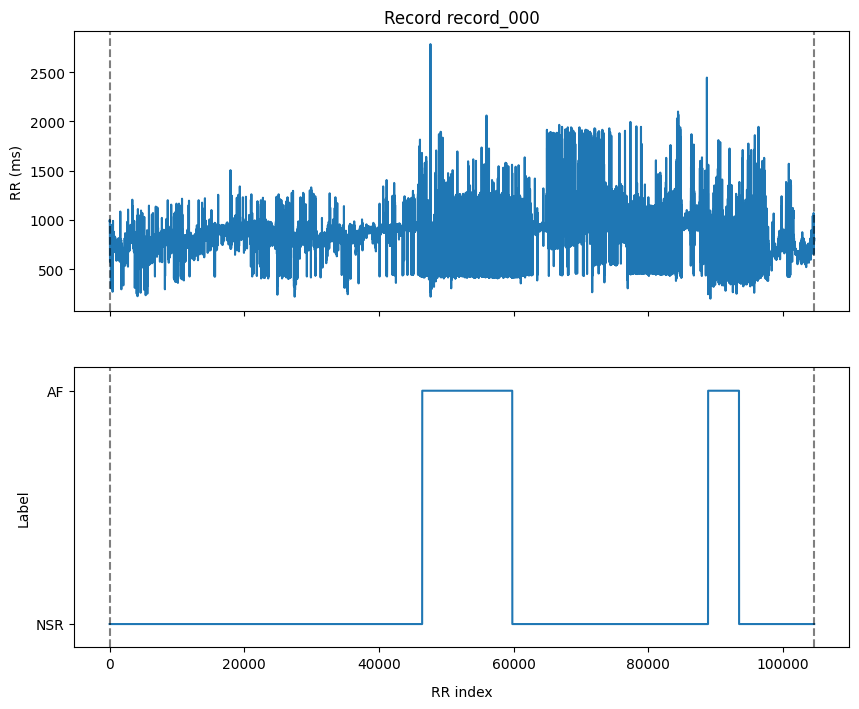

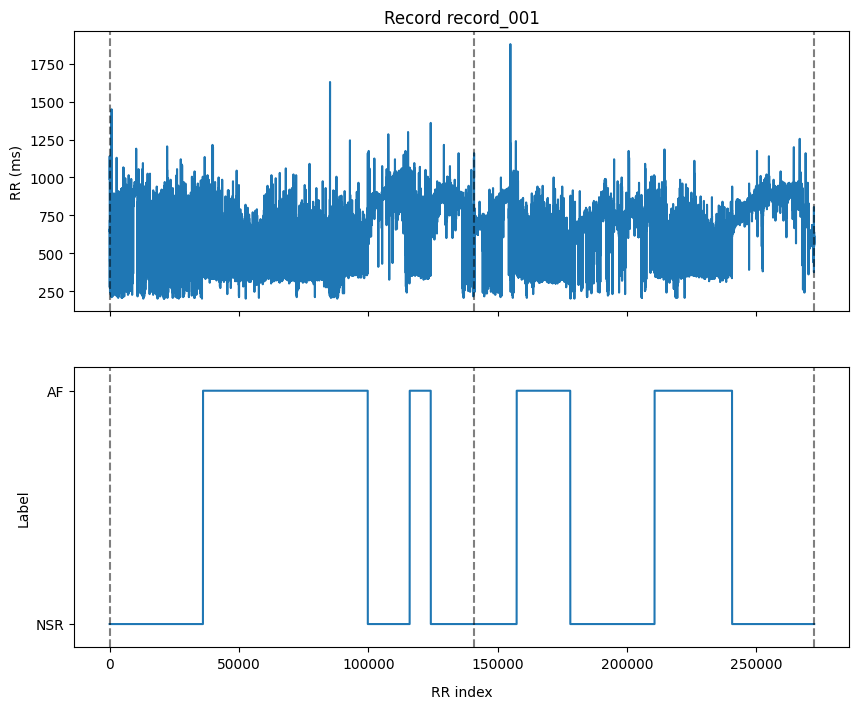

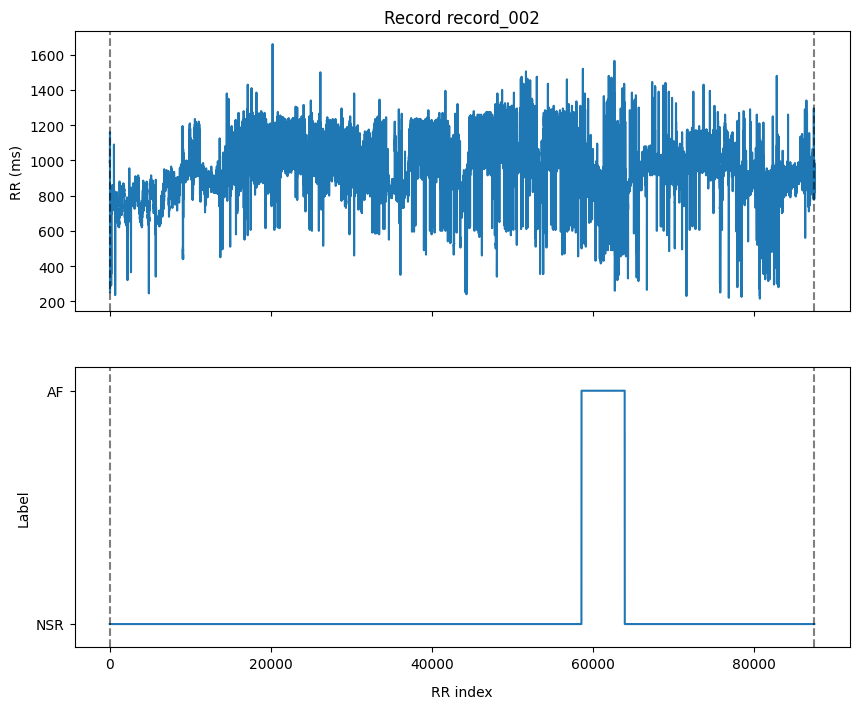

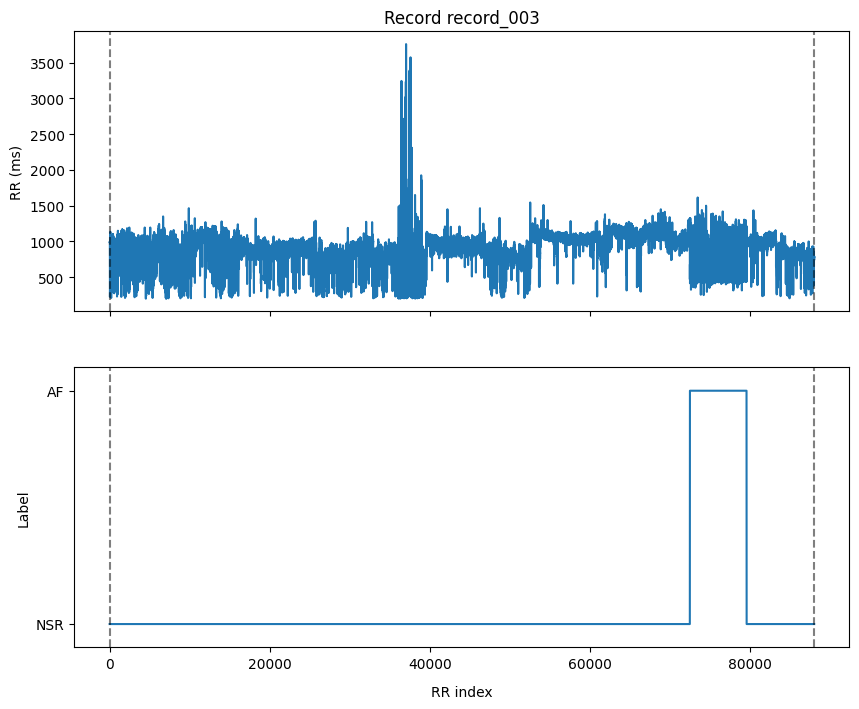

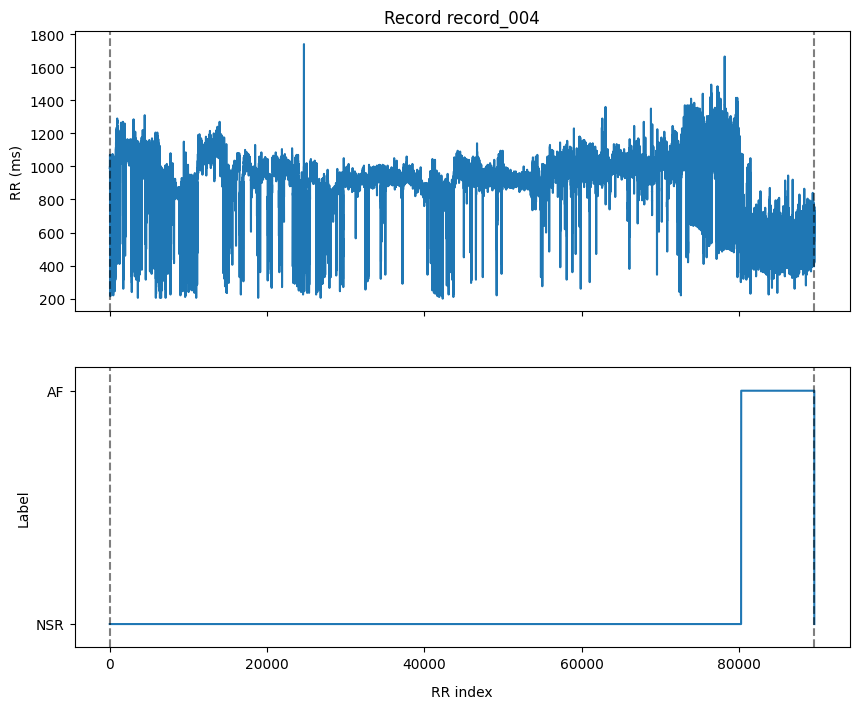

...

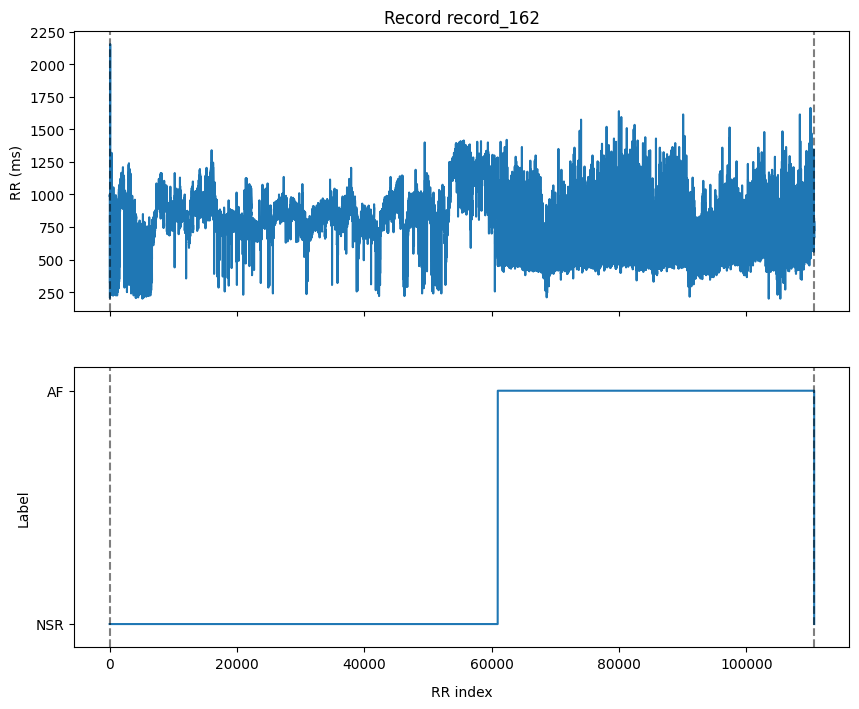

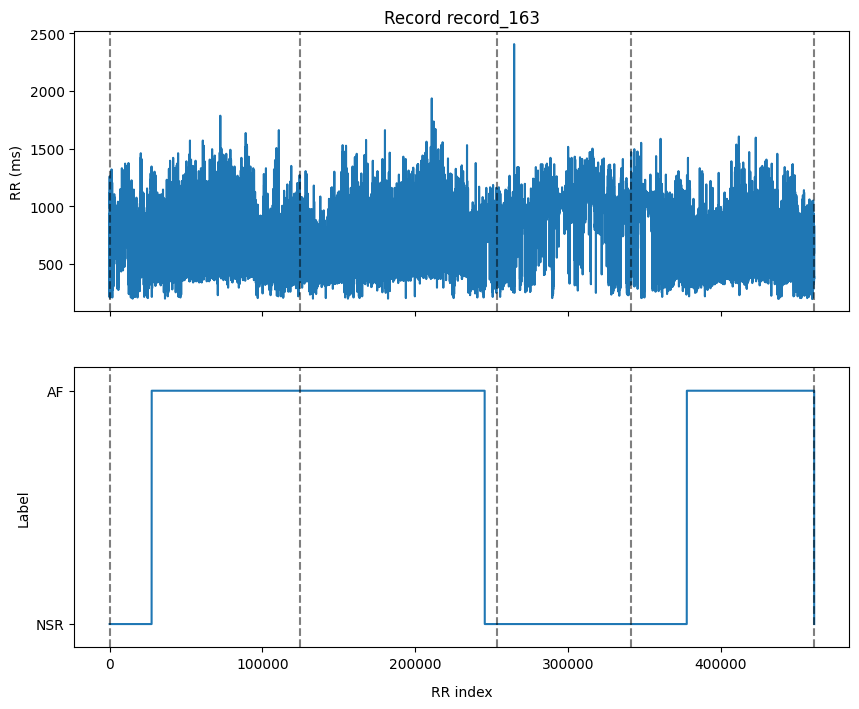

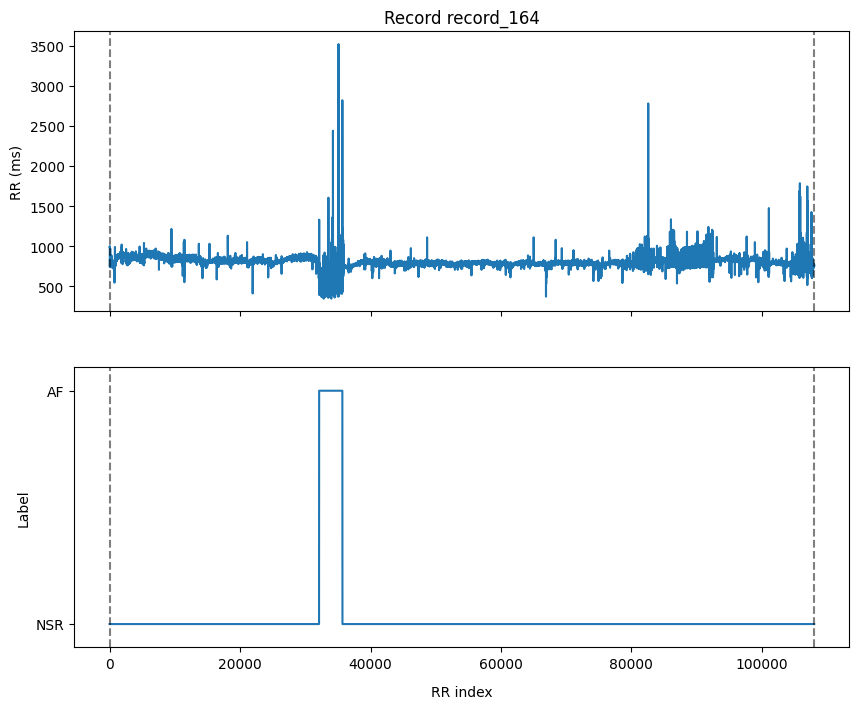

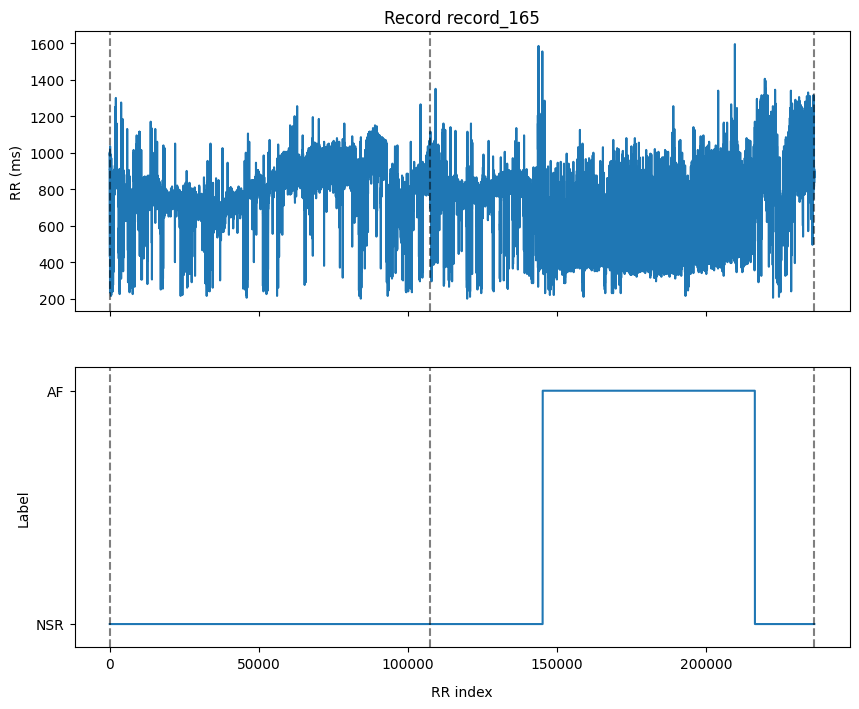

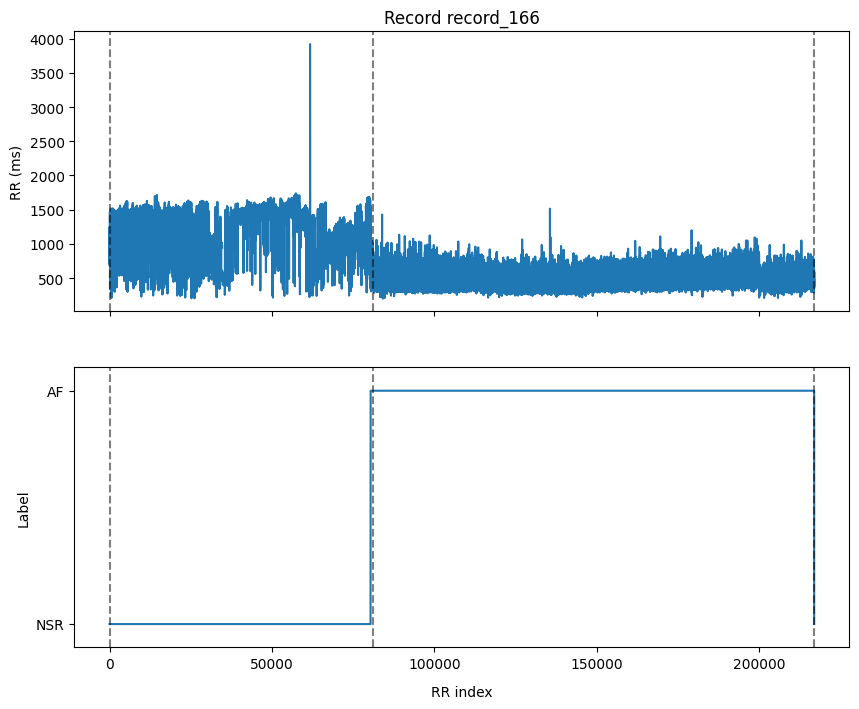

In [8]:

# Plot RR for each filtered record
for record_id in filtered_records:
    record = create_record(record_id, metadata_df, RECORDS_PATH)
    record.load_rr_record()
    record.plot_rr()

In [9]:
np.save("save_files/filtered_records.npy", np.array(filtered_records))

# Segment the RRI and find pre-af threshold

To find the label the pre-af we first need to find the pre-af therehold for coefficient of variation of RRI. 

1. Crop out the first SNR and first AF event from the filter record. Only the first SNR and AF is extracted is due to concern of avoiding threshold bias to long duration data. We extract these segment into dictionary form, which have keys of patient_id, record_id, snr_signal and af_signal. We do this to ease the train test split on patient level easier.

In [20]:
from concurrent.futures import ThreadPoolExecutor

# Function to process each record and extract RRI segments as per the paper
def extract_snr_n_af(record_id):
    print(f"Processing record ID: {record_id}")
    record = create_record(record_id, metadata_df, RECORDS_PATH)
    record.load_rr_record()
    # These are needed to avoid wrong croping when Af event in second day
    rri = np.concatenate(record.rr)/1000  # convert to seconds
    print(np.mean(rri), np.std(rri))
    af_labels = np.concatenate(record.rr_labels)
    
    one_indices = np.where(af_labels == 1)[0]

    first_af_event = record.rr_labels_df.iloc[0]
    first_af_event_index_duration = first_af_event['end_rr_index'] - first_af_event['start_rr_index']

    first_af_start_index = one_indices[0]
    first_af_end_index = first_af_start_index + first_af_event_index_duration

    # We dont want the callibration period
    callibration_duration_idx = 30  
    snr_rri = rri[callibration_duration_idx:first_af_start_index]
    af_rri = rri[first_af_start_index:first_af_end_index]
    
    return {
        'patient_id': record.metadata.patient_id,
        'record_id': record_id,
        'snr_signal': snr_rri,
        'af_signal': af_rri
    }


snr_af_segments_list = []
with ThreadPoolExecutor() as executor:
    snr_af_segments_list = list(executor.map(extract_snr_n_af, filtered_records))

# sort by record_id
snr_af_segments_list = sorted(snr_af_segments_list, key=lambda x: x['record_id'])
# save to npy file
np.save("save_files/snr_af_segments_list.npy", np.array(snr_af_segments_list))


Processing record ID: record_000
Processing record ID: record_001
Processing record ID: record_002
Processing record ID: record_003
Processing record ID: record_004
Processing record ID: record_005
Processing record ID: record_006
Processing record ID: record_007
Processing record ID: record_008
Processing record ID: record_009Processing record ID: record_011

Processing record ID: record_012
Processing record ID: record_013
Processing record ID: record_015Processing record ID: record_016

Processing record ID: record_019
----------------------
Looking inside: ..\Records\record_000
Files in record folder: [WindowsPath('../Records/record_000/record_000_ecg_00.h5'), WindowsPath('../Records/record_000/record_000_ecg_labels.csv'), WindowsPath('../Records/record_000/record_000_rr_00.h5'), WindowsPath('../Records/record_000/record_000_rr_labels.csv')]
rr_label:----------------------
Looking inside: ..\Records\record_002
Files in record folder: [WindowsPath('../Records/record_000/record_000_r

2. After we have the SNR and AF segment for each record, we need to find the coefficient of variation of RRI from each records.
- We crop both segment into 5 minutes segments with 30 second overlap
- For each 5 minutes segments, another 30 second sub segments with overlap 5 second is cropped.
- In each 30 sub segments, the coefficeint of variation (CV) of RRI is calculated using (std/mean)
- For each 5 minutes segments, there will be a list of CVs, the median of the CVs is extracted.
- Then we will have a list of CV medians for SNR and AF for each record.
- For each record, only 50 CV medians is selected from each SNR and AF by random selection. We do this to avoid the threshold bias to records which has longer SNR and AF segments.

In [17]:
# load from npy file
snr_af_segments_list = np.load("save_files/snr_af_segments_list.npy", allow_pickle=True).tolist()

In [18]:

# Helper function to get index forward based on duration
def get_rri_foward_with_duration(rri_sec, start_idx, duration):
    end_idx = None
    rri_sec_cumsum = np.cumsum(rri_sec[start_idx:])
    if rri_sec_cumsum.size == 0:
        print("Warning: Start index is out of bounds.")
        return start_idx

    if rri_sec_cumsum[-1] < duration:
        end_idx = len(rri_sec_cumsum)
        return end_idx
    for i, cum_sum in enumerate(rri_sec_cumsum):
        if cum_sum >= duration:
            end_idx = start_idx + i + 1
            break
    return end_idx

def split_rri_segments_to_the_end(rri_snr, window_duration_sec, steps_sec):
    rri = rri_snr
    snr_segments =[]
    duration = 0
    start_idx = 0
    while True:
        end_idx = get_rri_foward_with_duration(rri, start_idx, window_duration_sec)
        if end_idx is None or end_idx <= start_idx:
            break
        snr_segments.append(rri[start_idx:end_idx])    

        # Move the start index forward by the step size
        start_idx = get_rri_foward_with_duration(rri, start_idx, steps_sec)
        duration += steps_sec
    return snr_segments


In [19]:
def coefficient_of_variation(arr):
    if len(arr) == 0 or np.mean(arr) == 0:
        print("Warning: Empty array or mean is zero in CV calculation.")
        return np.nan
    return np.std(arr, ddof=1) / np.mean(arr)

all_snr_cvs_median = []
all_af_cvs_median = []

for rri_segments in snr_af_segments_list:

    rri_snr = rri_segments['snr_signal']
    rri_af = rri_segments['af_signal']

    # print(rri_snr)
    snr_seg = split_rri_segments_to_the_end(rri_snr, window_duration_sec=60*5, steps_sec=60*4.5)
    af_seg = split_rri_segments_to_the_end(rri_af, window_duration_sec=60*5, steps_sec=60*4.5)

    # print(snr_seg)
    snr_CV_median = []
    for seg in snr_seg:
        CV_ = []
        for sub_seg in split_rri_segments_to_the_end(seg, window_duration_sec=30, steps_sec=5):
            CV_.append(coefficient_of_variation(sub_seg))
        # print(np.median(CV_))
        snr_CV_median.append(np.median(CV_))

    af_CV_median = []
    for seg in af_seg:
        CV_ = []
        for sub_seg in split_rri_segments_to_the_end(seg, window_duration_sec=30, steps_sec=5):
            CV_.append(coefficient_of_variation(sub_seg))
        # print(np.median(CV_))
        af_CV_median.append(np.median(CV_))

    # Down sample to avoid bias from long records, each CVs here have 4.5 minutes
    MAX_CVS_PER_RECORD = 50
    if len(snr_CV_median) > MAX_CVS_PER_RECORD:
        # Randomly sample MAX_CVS_PER_RECORD 
        sampled_indices = np.random.choice(len(snr_CV_median), MAX_CVS_PER_RECORD, replace=False)
        snr_CV_median = [snr_CV_median[i] for i in sampled_indices]

    if len(af_CV_median) > MAX_CVS_PER_RECORD:
        # Randomly sample MAX_CVS_PER_RECORD
        sampled_indices = np.random.choice(len(af_CV_median), MAX_CVS_PER_RECORD, replace=False)
        af_CV_median = [af_CV_median[i] for i in sampled_indices]

    all_snr_cvs_median.extend(snr_CV_median)
    all_af_cvs_median.extend(af_CV_median)

# print(np.median(snr_cvs), np.median(pre_af_cvs), np.median(af_cvs))

In [14]:
print(len(all_snr_cvs_median), len(all_af_cvs_median))

4685 3288


In [15]:
# print mean of all_snr_cvs_median and all_af_cvs_median
print(np.mean(all_snr_cvs_median), np.mean(all_af_cvs_median))

0.07403869861750488 0.17497352883443404


3. After we have the CV medians for AF and SNR we plot the KDE plot and use the intersection of the plot as threshold.

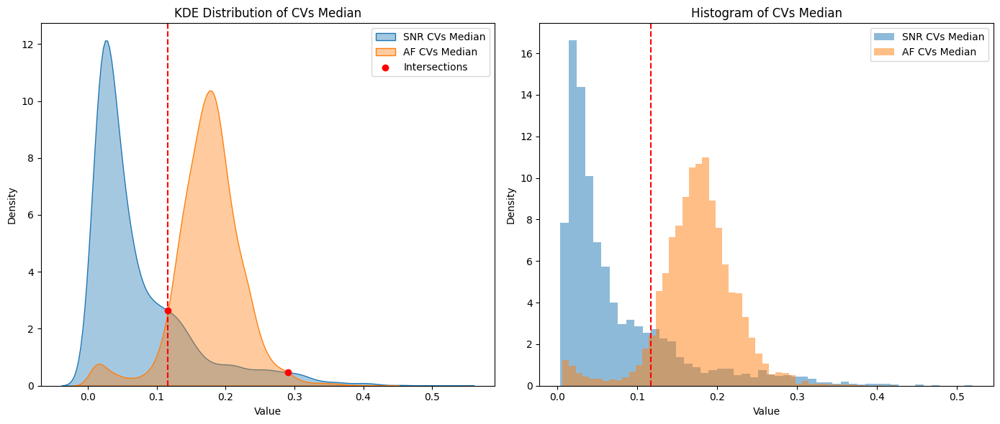

Intersection points (x,y):
(0.1164, 2.6364)
(0.2903, 0.4703)


In [16]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Build KDEs
kde1 = gaussian_kde(all_snr_cvs_median)
kde2 = gaussian_kde(all_af_cvs_median)

# Define a common grid
xmin = min(min(all_snr_cvs_median), min(all_af_cvs_median))
xmax = max(max(all_snr_cvs_median), max(all_af_cvs_median))
x = np.linspace(xmin, xmax, 1000)

y1 = kde1(x)
y2 = kde2(x)

# Find intersections
diff = y1 - y2
sign_changes = np.where(np.diff(np.sign(diff)) != 0)[0]

x_intersections, y_intersections = [], []
for idx in sign_changes:
    x0, x1 = x[idx], x[idx+1]
    y0, y1_diff = diff[idx], diff[idx+1]
    # Linear interpolation
    xi = x0 - y0 * (x1 - x0) / (y1_diff - y0)
    yi = kde1(xi)[0]   # extract scalar
    x_intersections.append(float(xi))
    y_intersections.append(float(yi))

# ==== Plot ====
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: KDE plots with intersections
sns.kdeplot(all_snr_cvs_median, label="SNR CVs Median", fill=True, alpha=0.4, ax=axs[0])
sns.kdeplot(all_af_cvs_median, label="AF CVs Median", fill=True, alpha=0.4, ax=axs[0])
axs[0].scatter(x_intersections, y_intersections, c="red", zorder=5, label="Intersections")
axs[0].set_xlabel("Value")
axs[0].set_ylabel("Density")
axs[0].set_title("KDE Distribution of CVs Median")
axs[0].legend()

# Subplot 2: Histogram plots
axs[1].hist(all_snr_cvs_median, bins=50, alpha=0.5, label="SNR CVs Median", density=True)
axs[1].hist(all_af_cvs_median, bins=50, alpha=0.5, label="AF CVs Median", density=True)
axs[1].set_xlabel("Value")
axs[1].set_ylabel("Density")
axs[1].set_title("Histogram of CVs Median")
axs[1].legend()

# Add vertical lines at first intersection
xi = x_intersections[0]
axs[0].axvline(x=xi, color='red', linestyle='--', label='Intersection')
axs[1].axvline(x=xi, color='red', linestyle='--', label='Intersection')

# show the first x intersection on the plots



plt.tight_layout()
plt.show()

print("Intersection points (x,y):")
for xi, yi in zip(x_intersections, y_intersections):
    print(f"({xi:.4f}, {yi:.4f})")


In [ ]:
THRESHOLD = 0.1164 # The threshold might be different each time due to random sampling, 0.1164 come from my first run.

Things to note: 
The thereshold is affected by the parameter below
- Cropped segments duration and its overlap
- Cropped sub segments duration and its overlap
- The different cap of CV median, where we used 50.
- Might affected by the random due to random selection.

If you see inside the WARN paper, they did not say how the exact step they takes to get the threshold.
Therefore the cropped segments and sub segments parameter we use here actually is the parameter they use to segment the pre-AF segments.
The cap of CV median and random selection is add by myself.

# Label Pre AF

After we have the CV threshold, we can now start to extract pre-AF label.
1. For each record, crop 5 minutes backward from af start
2. Using same method to extract CV median from that 5 min.
3. If the CV median exceed the threshold, move to next 5 min with 30 sec overlap backward in time.
4. If the CV median do not exceed the threshold, this 5 min until the af start is labeled as pre-AF.


Then the SNR, pre-AF and AF segments are extracted and put inside the dictionary with keys: 
- patient_id
- record_id
- snr_start_idx
- pre_af_start_idx
- af_start_idx
- af_end_idx
- snr_signal
- pre_af_signal
- af_signal





In [ ]:
# Helper functions to get index on RRI array backward in time duration
def get_rri_backward_with_duration(rri, start_idx, duration_sec):
    
    duration_ms = duration_sec  
    total_time = 0
    end_idx = start_idx
    
    # Iterate backward through the RRI array
    for i in range(start_idx - 1, -1, -1):
        if i < 0:
            print("Not enough RRI data to cover the specified duration.")
            end_idx = -1
            break
        total_time += rri[i]
        end_idx = i
        if total_time >= duration_ms:
            break
    return end_idx


# Split RRI segments based on given sliding window and step size
def split_rri_segments(rri_snr, start_index, crop_range_sec, window_duration_sec, steps_sec):
    rri = rri_snr
    snr_segments = []
    duration = 0
    start_idx = start_index
    
    # Compute the total available duration from start_idx
    total_available = np.sum(rri[start_idx:])

    # Limit crop_range_sec to available data
    crop_range_sec = min(crop_range_sec, total_available)
    while duration < (crop_range_sec - window_duration_sec):
        end_idx = get_rri_foward_with_duration(rri, start_idx, window_duration_sec)
        if end_idx is None or end_idx <= start_idx or end_idx > len(rri):
            print("No more segments can be extracted.")
            break
        snr_segments.append(rri[start_idx:end_idx])
        next_start_idx = get_rri_foward_with_duration(rri, start_idx, steps_sec)
        if next_start_idx is None or next_start_idx <= start_idx or next_start_idx >= len(rri):
            break
        start_idx = next_start_idx
        duration += steps_sec
    return snr_segments

# Split RRI segments from a given start index to a maximum window duration
def split_rri_segments_from_give_start_idx_to_max_win(rri_snr, start_idx, window_duration_sec=30, steps_sec=15, max_win_duration_sec=10*60):
    rri = rri_snr
    snr_segments =[]
    duration = 0
    start_idx = start_idx
    while True:
        # print(duration)
        if duration >= ( max_win_duration_sec - window_duration_sec):
            break
        # print(start_idx)
        end_idx = get_rri_foward_with_duration(rri, start_idx, window_duration_sec)
        if end_idx is None or end_idx <= start_idx:
            print("No more segments can be extracted.")
            break
        snr_segments.append(rri[start_idx:end_idx])    

        # Move the start index forward by the step size
        start_idx = get_rri_foward_with_duration(rri, start_idx, steps_sec)
        duration += steps_sec
    return snr_segments

In [19]:
def label_pre_af_find_pre_af_start(rri, af_start, threshold):
    end_idx = af_start
    while True:
        start_idx = get_rri_backward_with_duration(rri, end_idx, duration_sec=5*60)

        segment = split_rri_segments_from_give_start_idx_to_max_win(rri,start_idx=start_idx, window_duration_sec=30, steps_sec=5, max_win_duration_sec=5*60)

        CV_ = [coefficient_of_variation(seg) for seg in segment]
        cv_median = np.median(CV_)

        if cv_median < threshold:
            # print("Threshold reached")
            break
        elif cv_median >= threshold and start_idx >= 0:
            
            # end_idx equals to start_idx + 30 seconds, which is 4.5 minutes backward from previous end_idx
            end_idx = get_rri_foward_with_duration(rri, start_idx, 30)
        
    return start_idx

In [ ]:
from concurrent.futures import ThreadPoolExecutor


def get_rri_segments_with_pre_af(record_id):
    print(f"Processing record ID: {record_id}")
    record = create_record(record_id, metadata_df, RECORDS_PATH)
    record.load_rr_record()

    
    # These are needed to avoid wrong croping whenAf event in second day
    rri = np.concatenate(record.rr)/1000  # convert to seconds
    af_labels = np.concatenate(record.rr_labels)
    
    # Find indices where af_labels == 1
    one_indices = np.where(af_labels == 1)[0]

    # Find label change points
    label_change_indices = np.where(np.diff(af_labels) != 0)[0] + 1
    af_start_ = label_change_indices[0]
    af_end_ = label_change_indices[1]

    af_start = af_start_
    af_end = af_end_

    pre_af_start = label_pre_af_find_pre_af_start(rri, af_start, threshold=THRESHOLD)

    # Label pre-AF segment with 2
    af_labels[pre_af_start:af_start] = 2
    
    snr_end_idx = np.where(af_labels != 0)[0][0]-1

    callibration_duration_idx = 30

    snr_rri = rri[callibration_duration_idx:snr_end_idx]        
    af_rri = rri[af_start:af_end]
    pre_af_rri = rri[af_labels == 2]

    assert len(af_rri) > 0, f"AF segment is empty for record {record_id}"
    assert len(pre_af_rri) == len(rri[pre_af_start:af_start]), f"Pre-AF segmentation goes wrong for record {record_id}"

    assert len(snr_rri) == len(rri[callibration_duration_idx:pre_af_start-1]), f"SNR segmentation goes wrong for record {record_id}, got {len(snr_rri)} vs {len(rri[callibration_duration_idx:pre_af_start-1])}"
    assert len(af_rri) == (af_end_ - af_start_), f"AF segment length mismatch for record {record_id}, got {len(af_rri)} vs {af_end_ - af_start_}"
    
    return {
        'patient_id': record.metadata.patient_id,
        'record_id': record_id,
        'snr_start_idx': 0,
        'pre_af_start_idx': pre_af_start,
        'af_start_idx': af_start,
        'af_end_idx': af_end,
        'snr_signal': snr_rri,
        'pre_af_signal': pre_af_rri,
        'af_signal': af_rri
    }


rri_segments_with_pre_af = []
with ThreadPoolExecutor() as executor:
    rri_segments_with_pre_af = list(executor.map(get_rri_segments_with_pre_af, filtered_records))

# sort by record_id
rri_segments_with_pre_af = sorted(rri_segments_with_pre_af, key=lambda x: x['record_id'])
# save to npy file
np.save("save_files/rri_segments_with_pre_af.npy", np.array(rri_segments_with_pre_af))


Processing record ID: record_000
Processing record ID: record_001
Processing record ID: record_002
Processing record ID: record_003
Processing record ID: record_004
Processing record ID: record_005
Processing record ID: record_006
Processing record ID: record_007
Processing record ID: record_008
Processing record ID: record_009
Processing record ID: record_011
Processing record ID: record_012
Processing record ID: record_013
Processing record ID: record_015
Processing record ID: record_016
Processing record ID: record_019
Processing record ID: record_020
Processing record ID: record_023
Processing record ID: record_024
Processing record ID: record_025
Processing record ID: record_026
Processing record ID: record_028
Processing record ID: record_032Processing record ID: record_038

Processing record ID: record_039
Processing record ID: record_041
Processing record ID: record_042
Processing record ID: record_043
Processing record ID: record_044
Processing record ID: record_047
Processing

After we have SNR, pre-AF and AF segments for each record, we plot out the segment cropped to investigate these segments.

In [32]:
rri_segments_with_pre_af = np.load("save_files/rri_segments_with_pre_af.npy", allow_pickle=True).tolist()

record_000


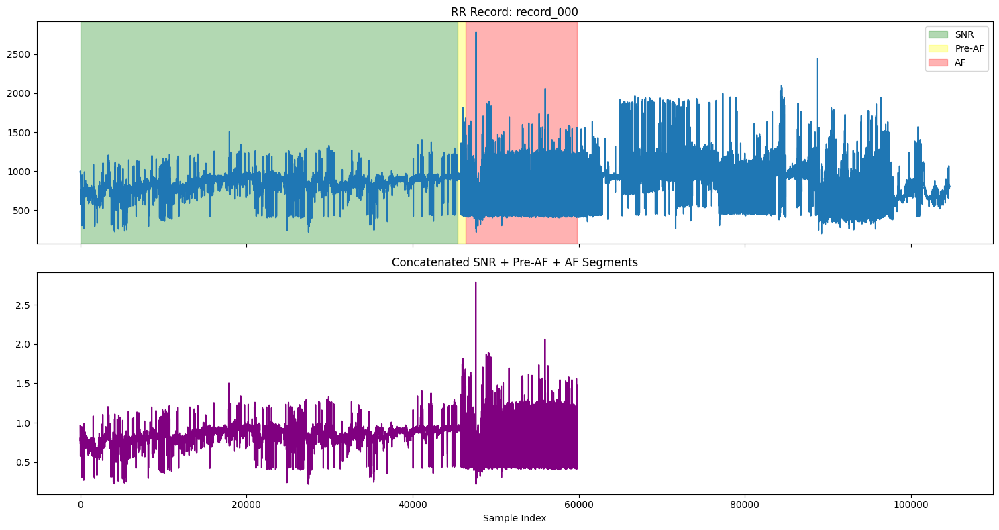

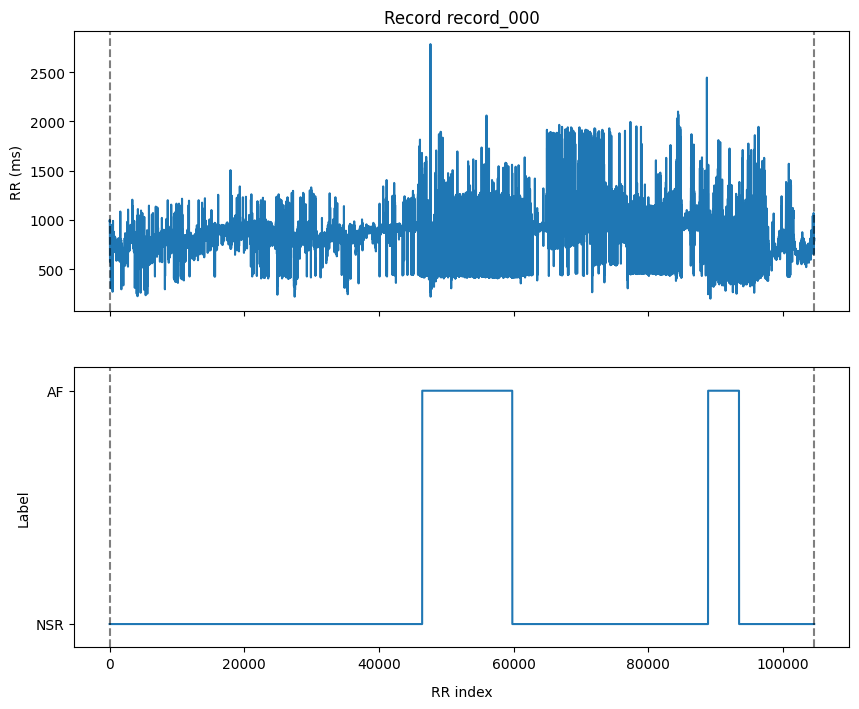

record_001


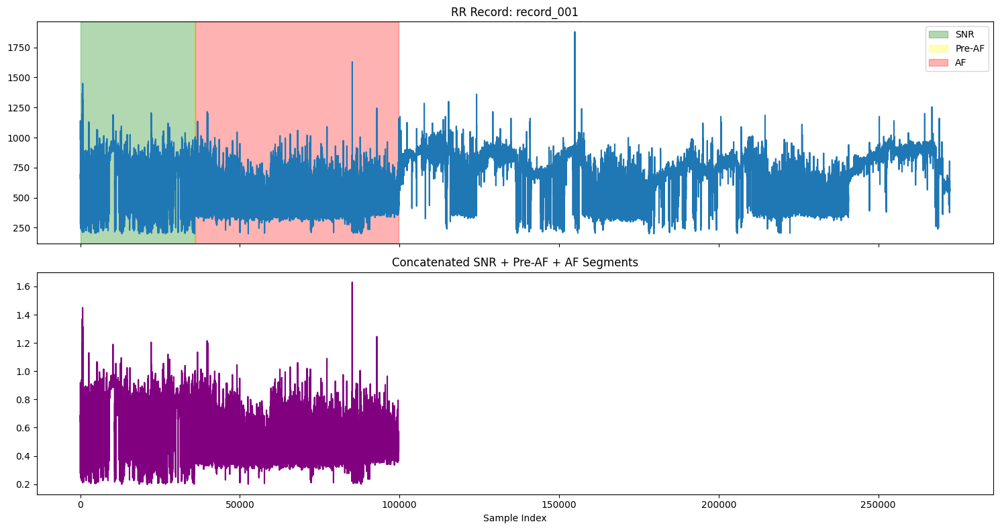

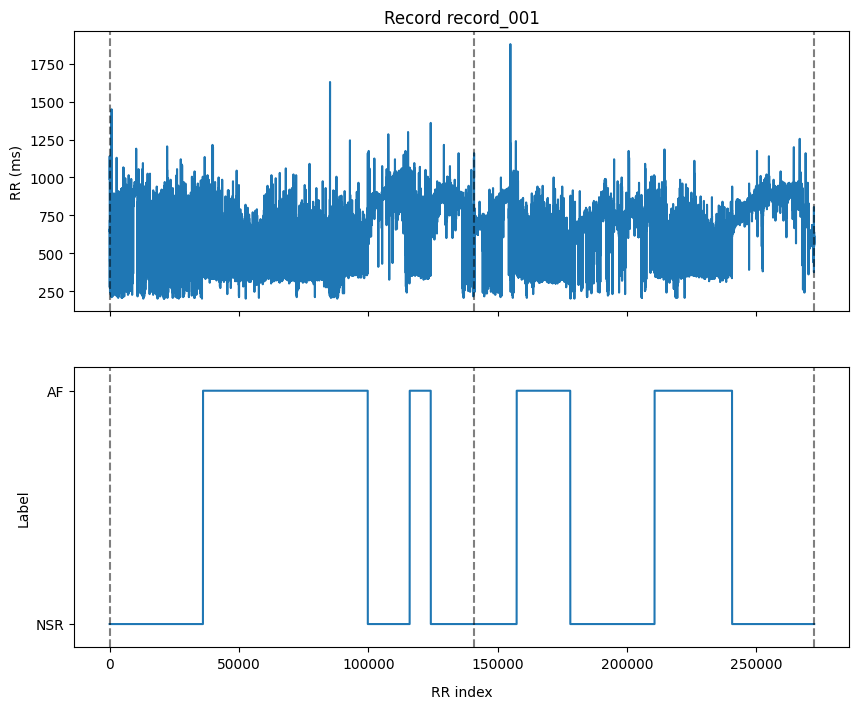

record_002


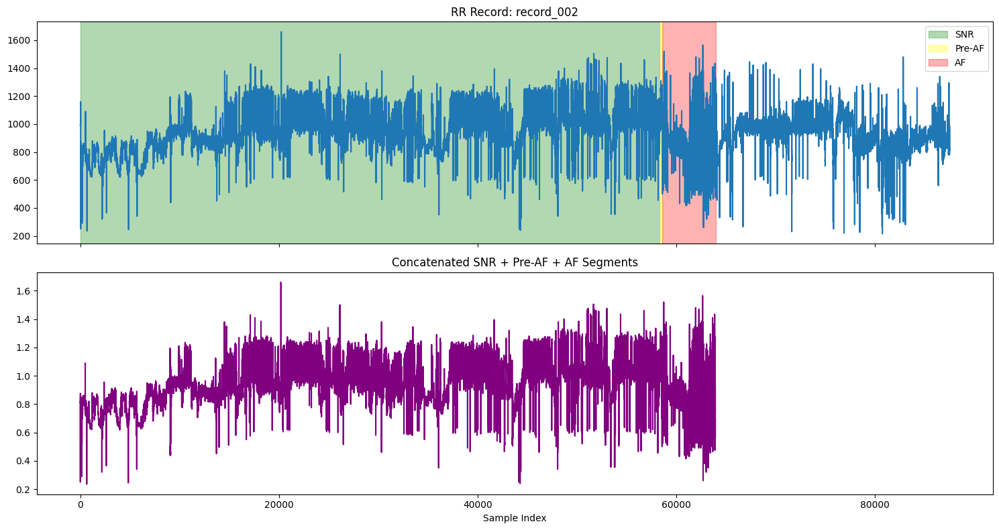

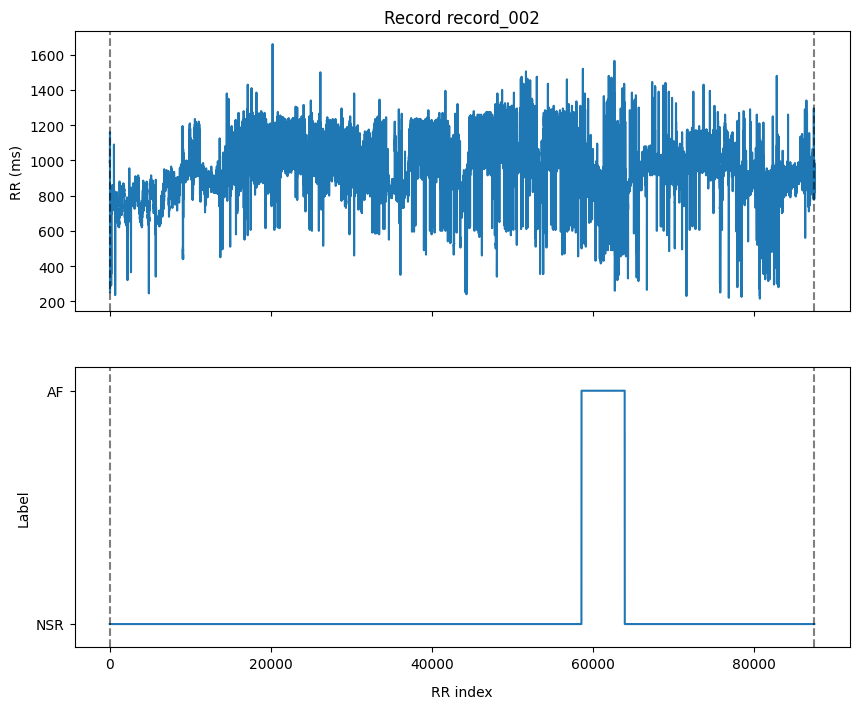

record_003


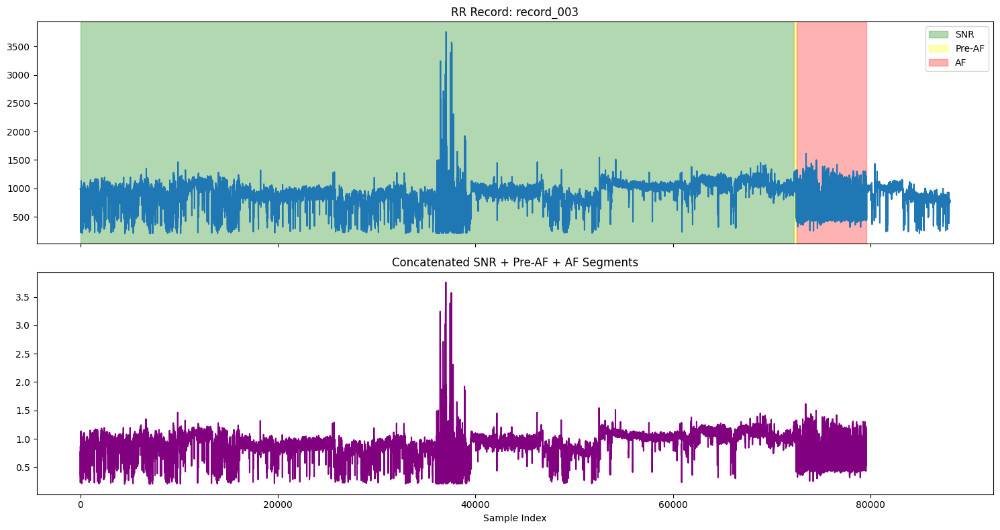

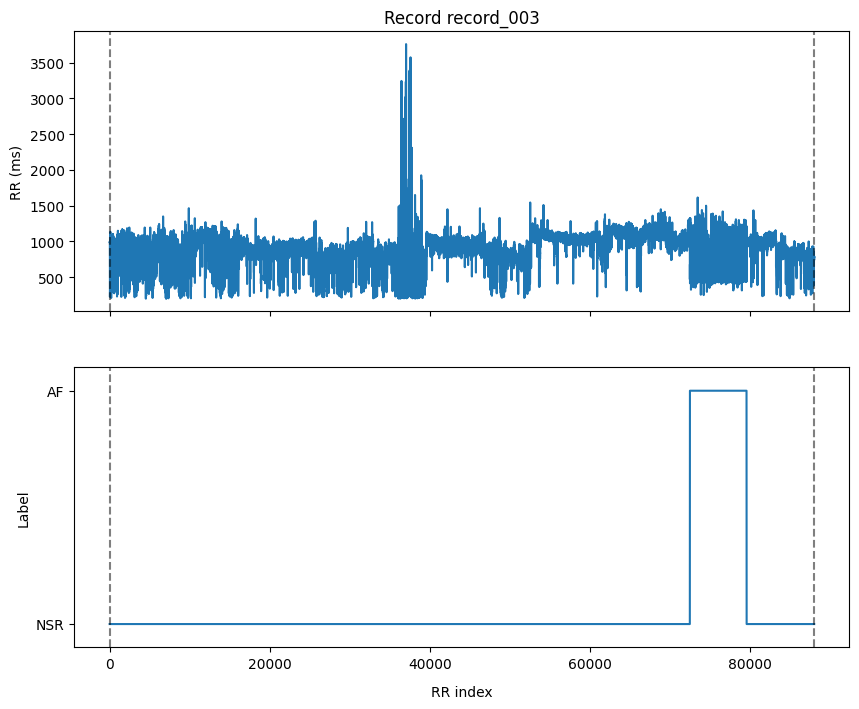

record_004


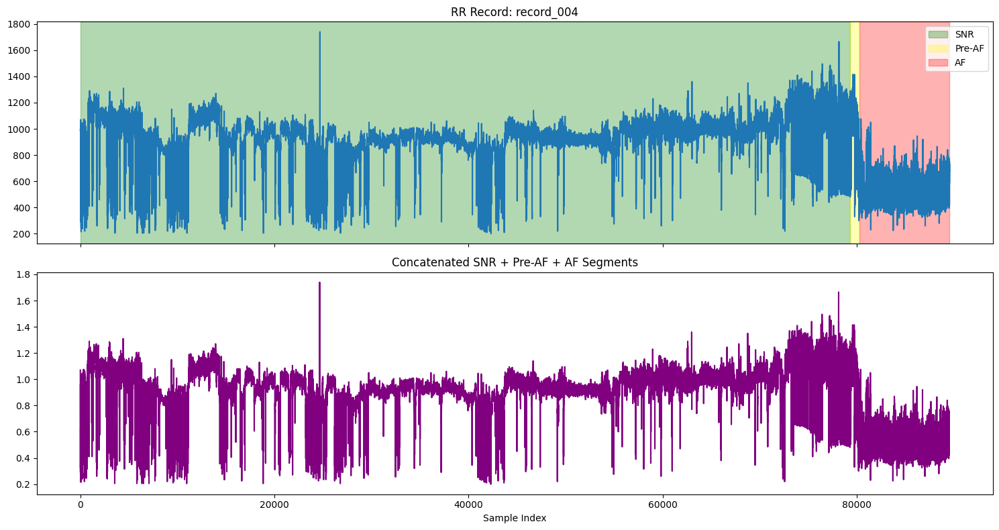

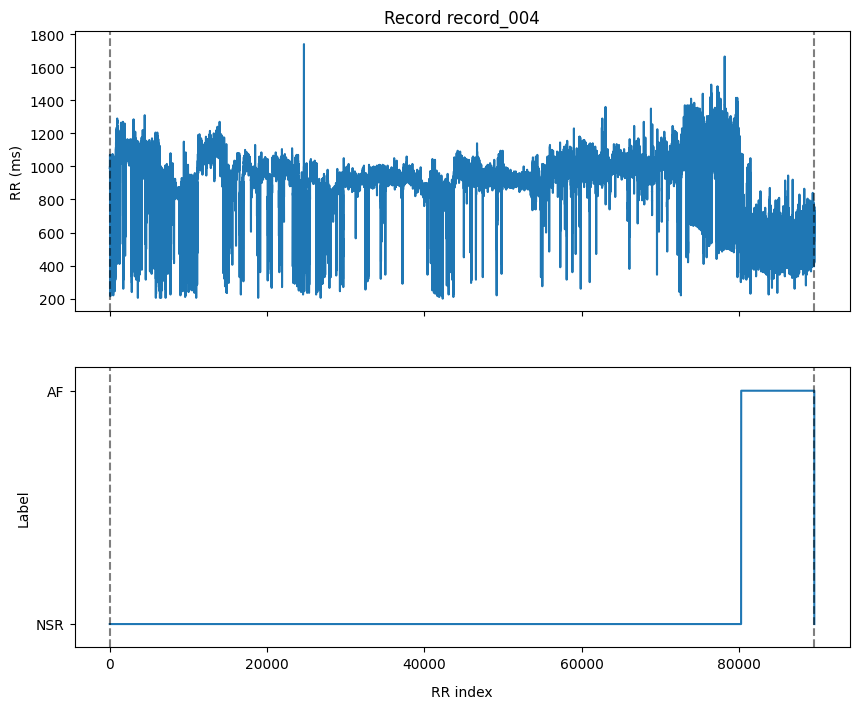

record_005


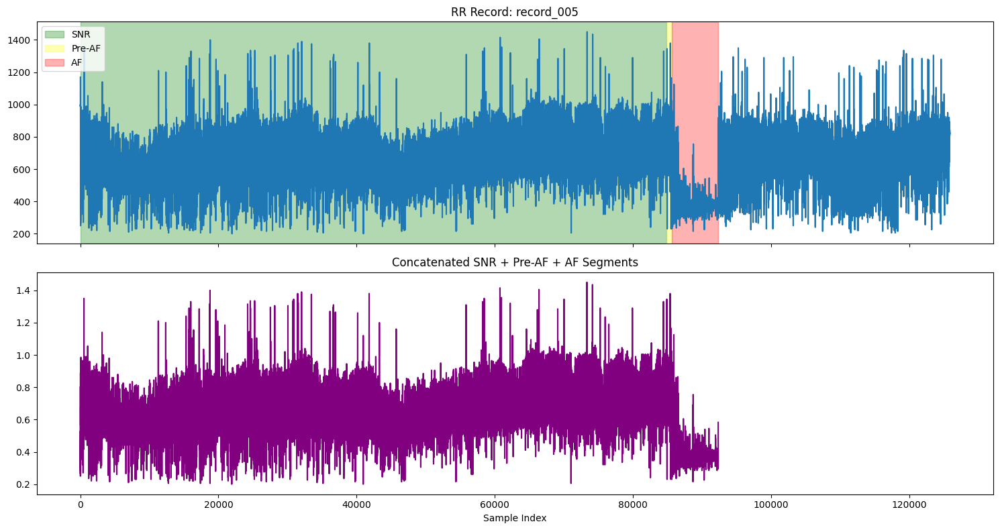

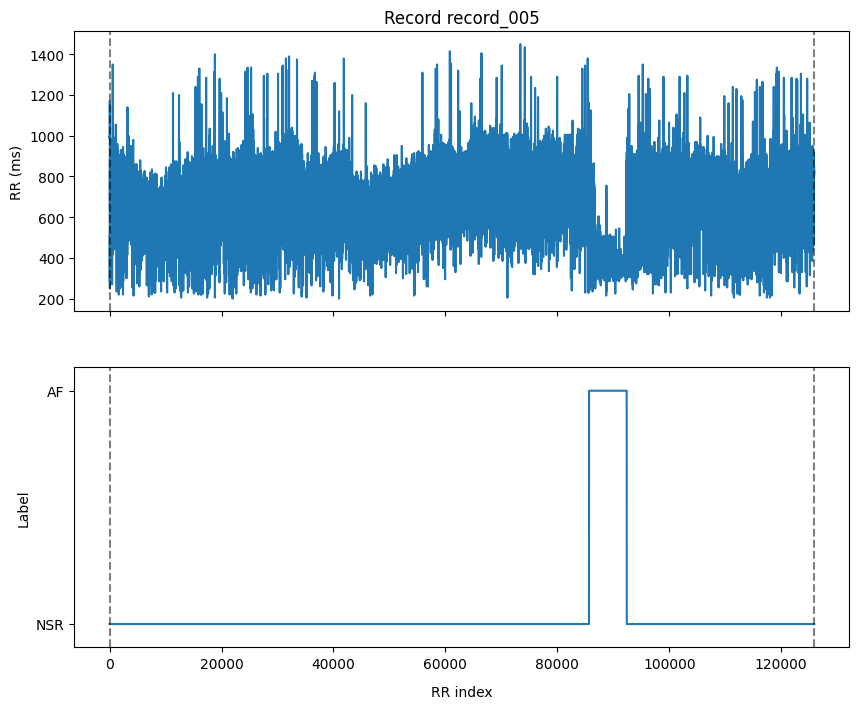

record_006


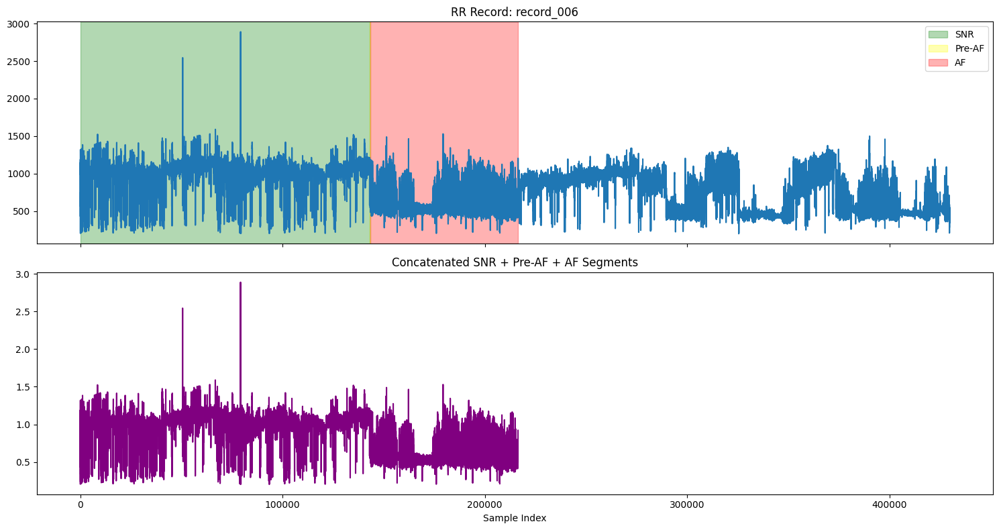

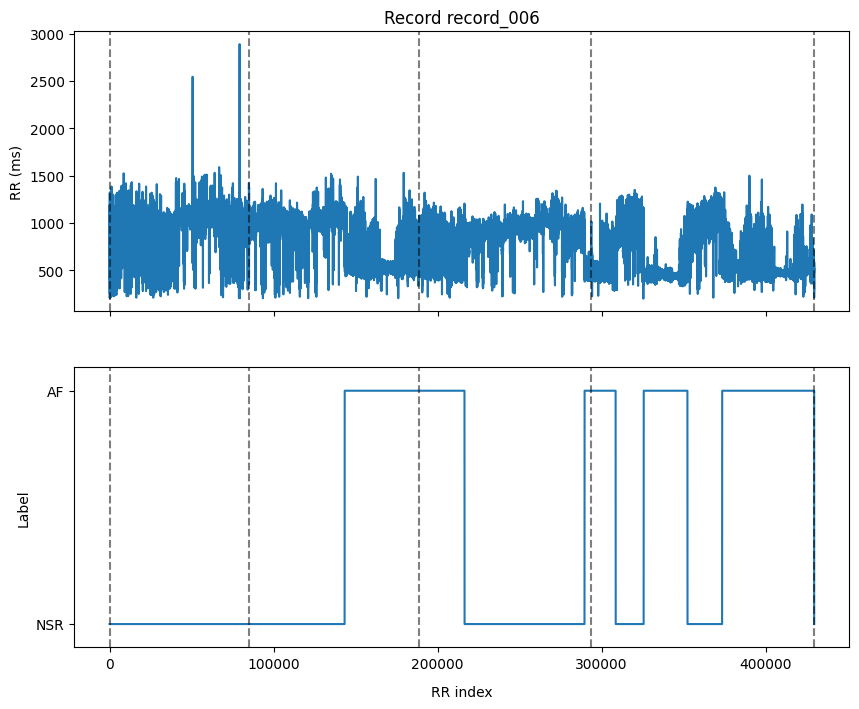

record_007


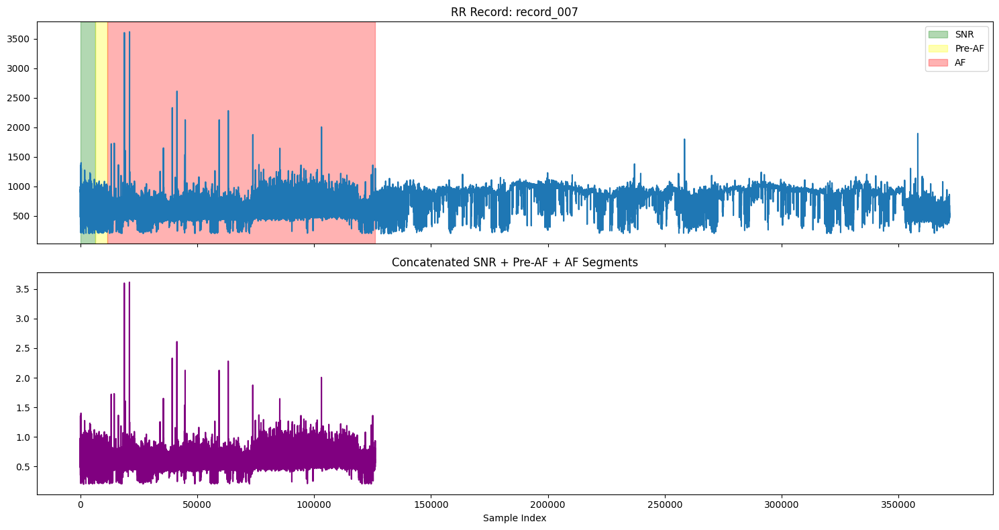

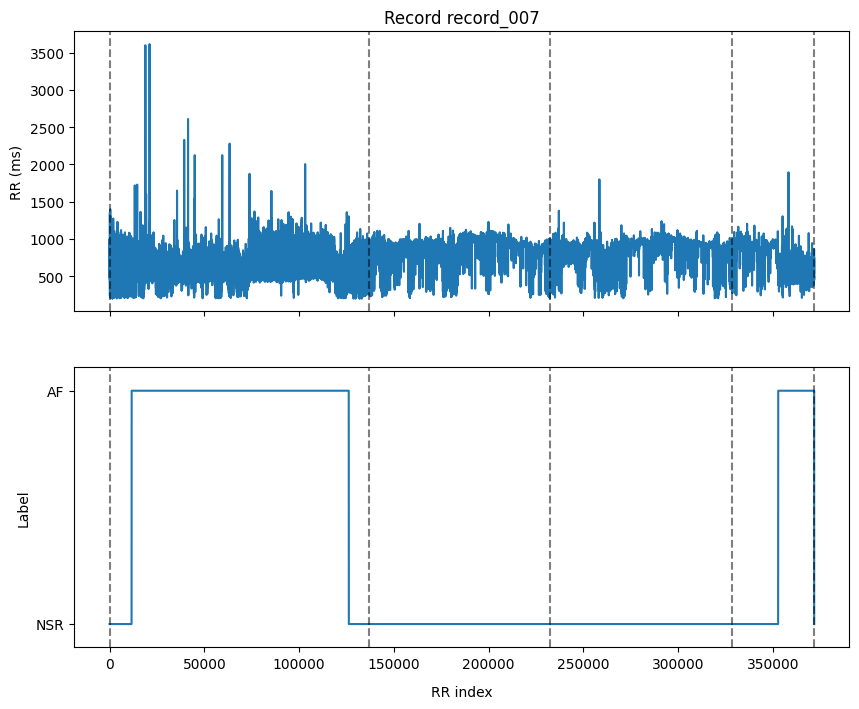

record_008


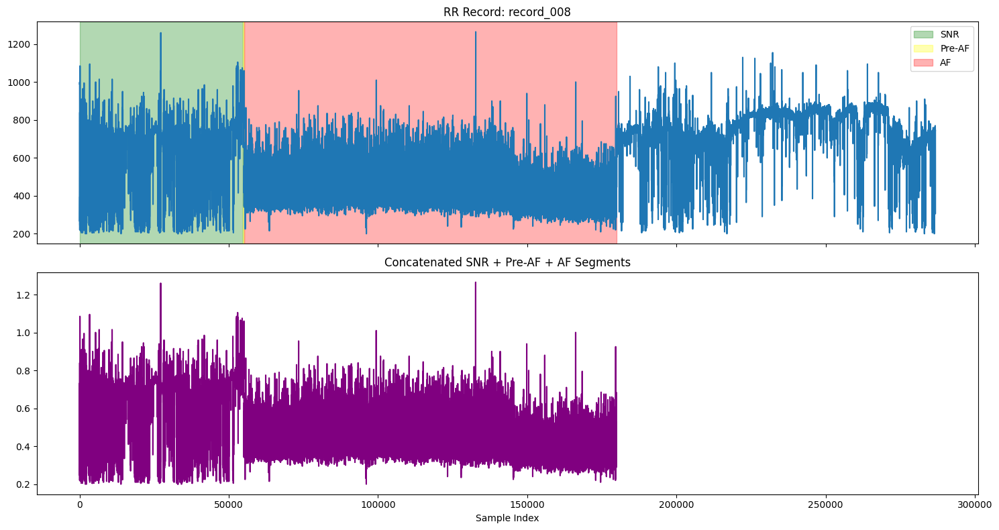

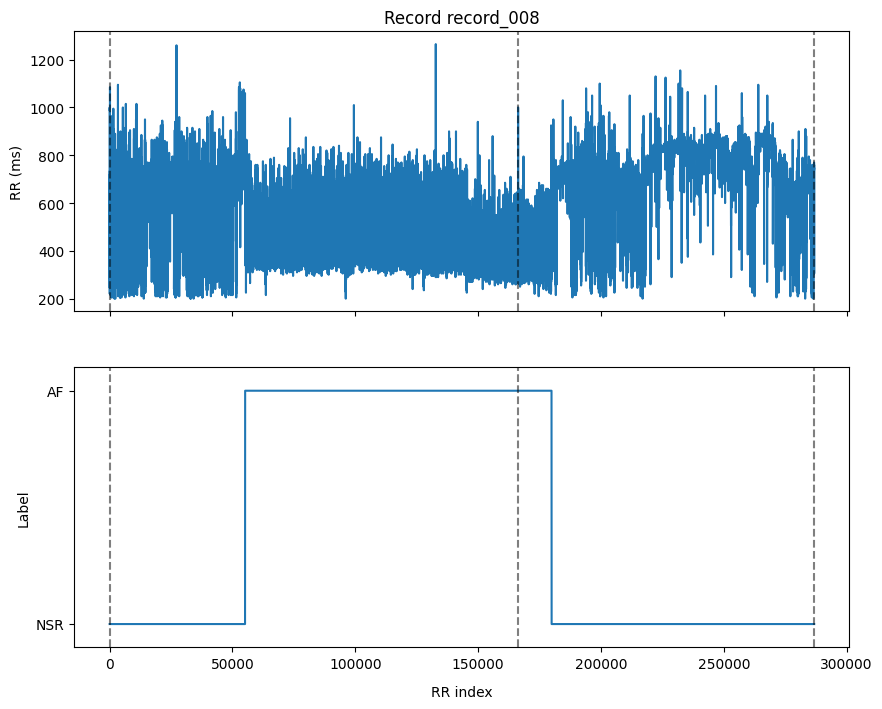

record_009


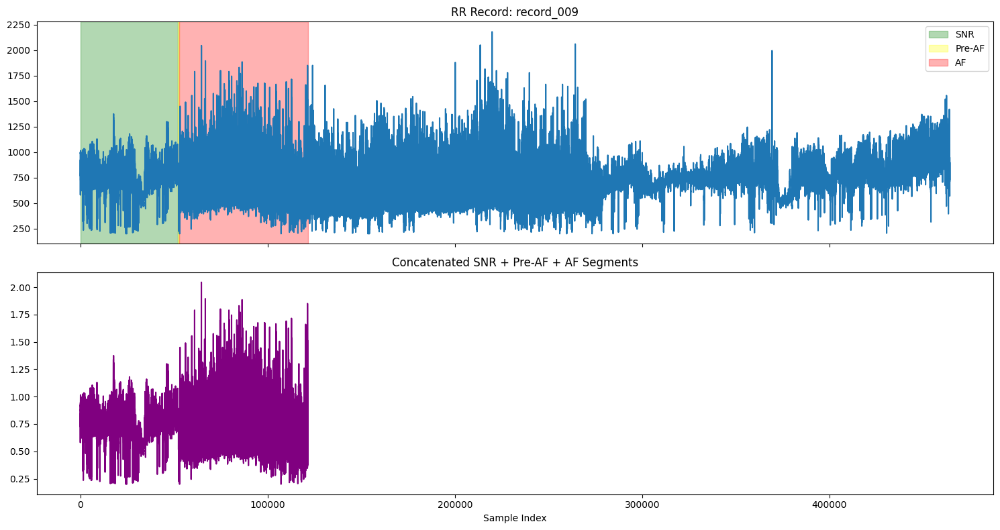

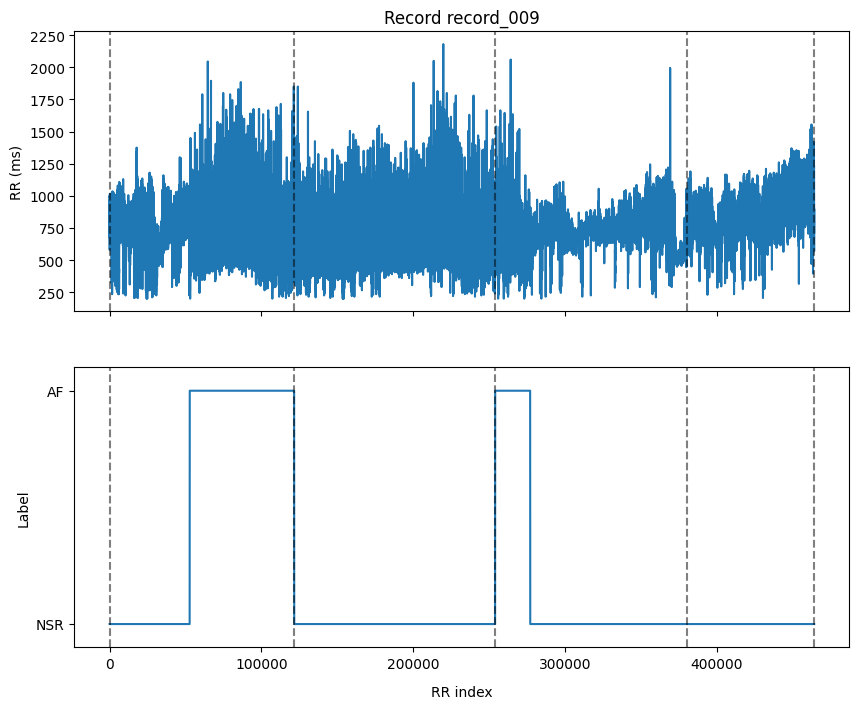

record_011


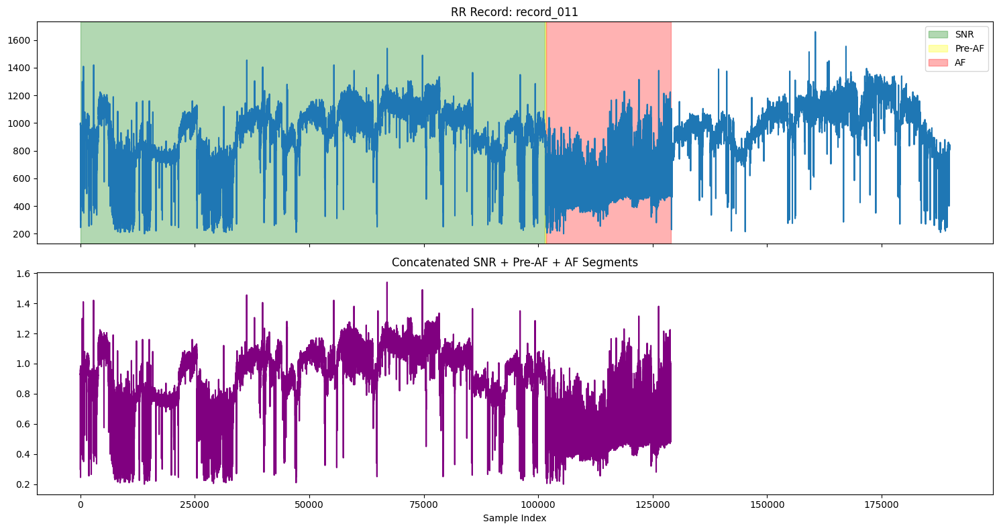

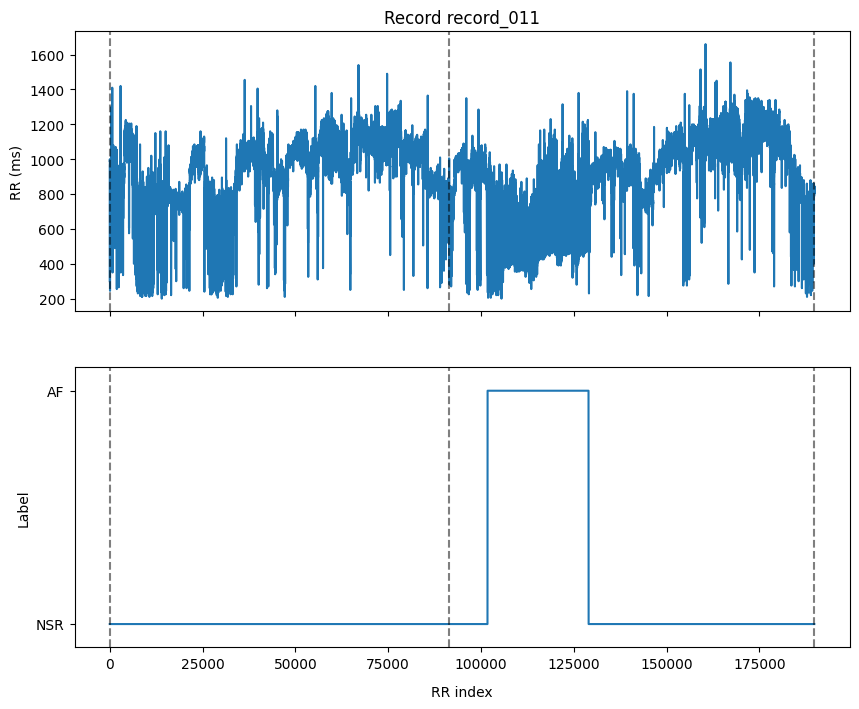

record_012


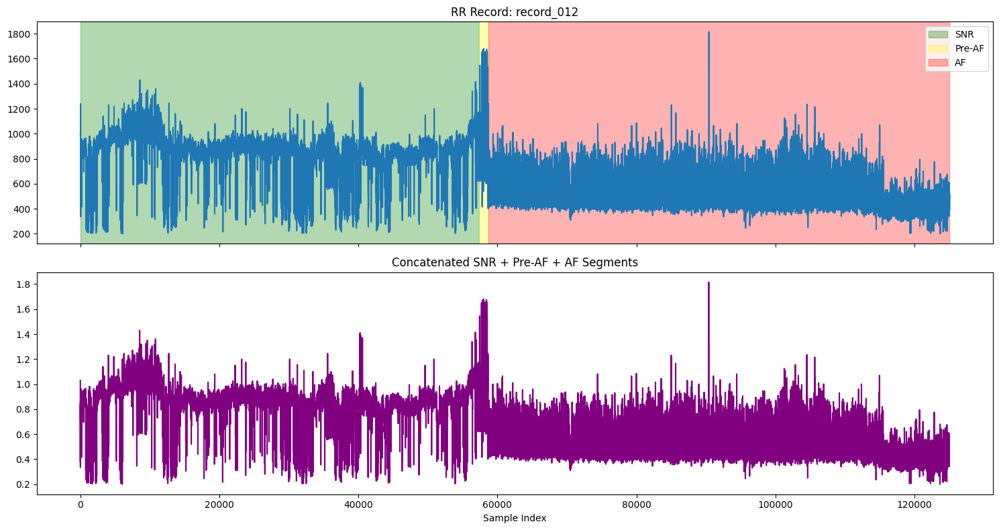

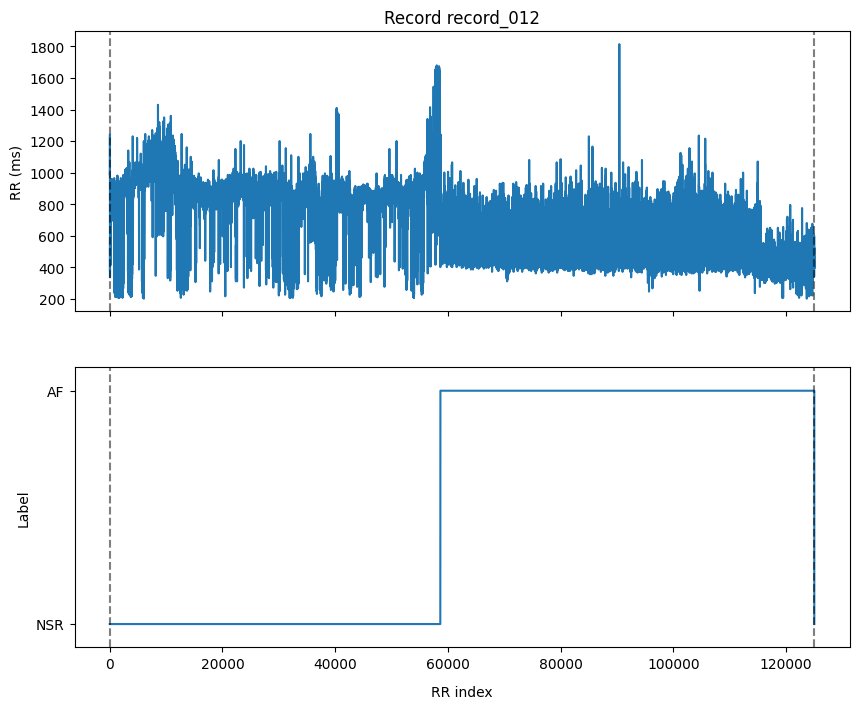

record_013


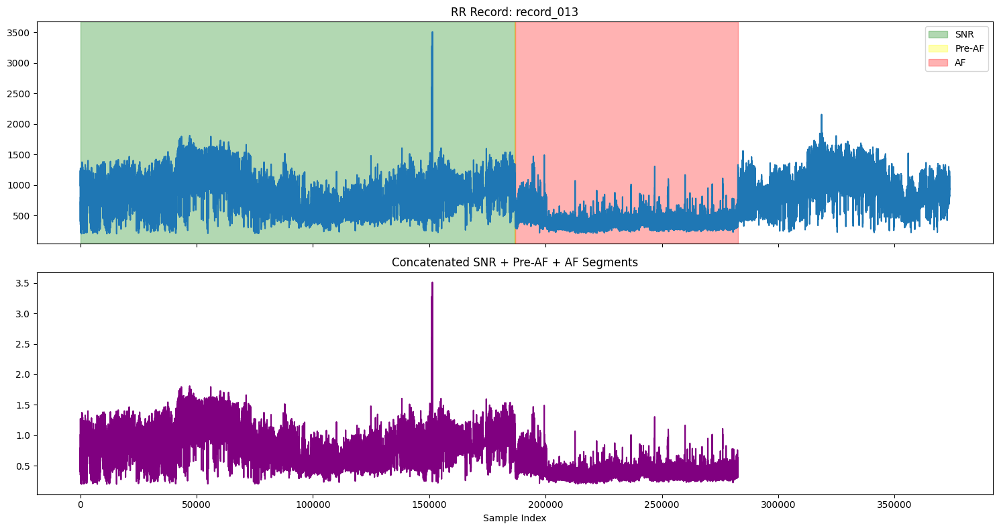

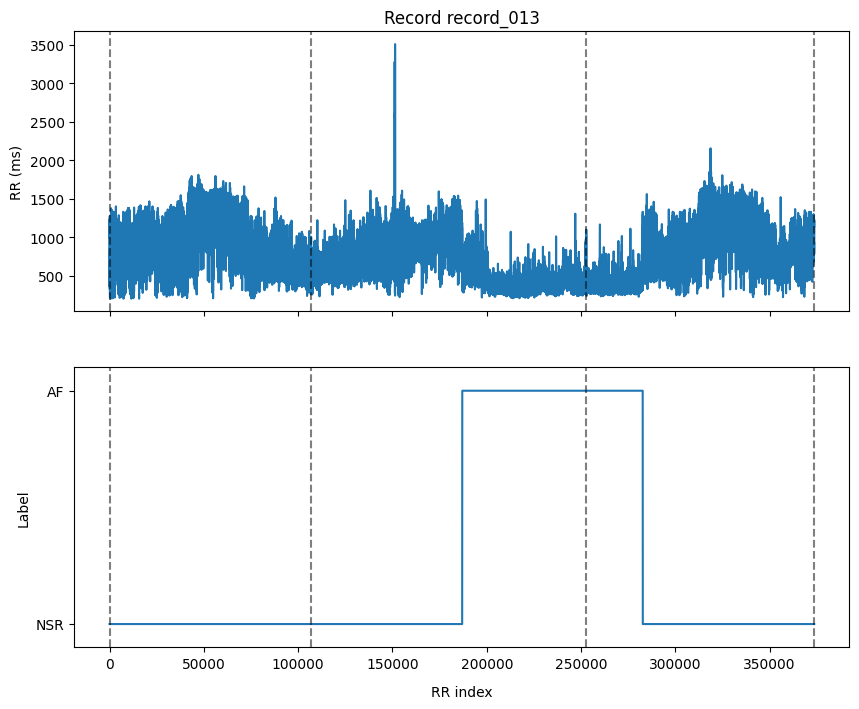

record_015


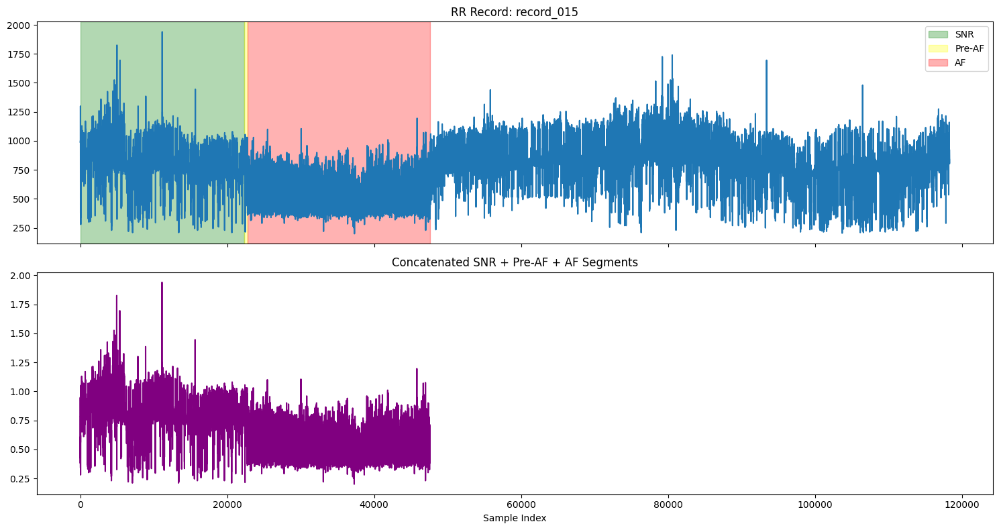

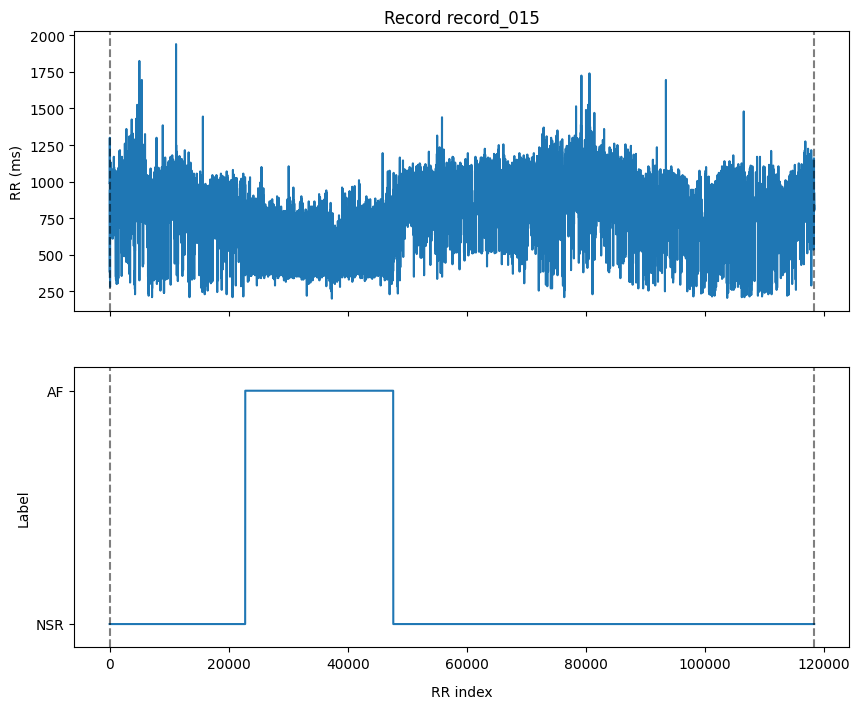

record_016


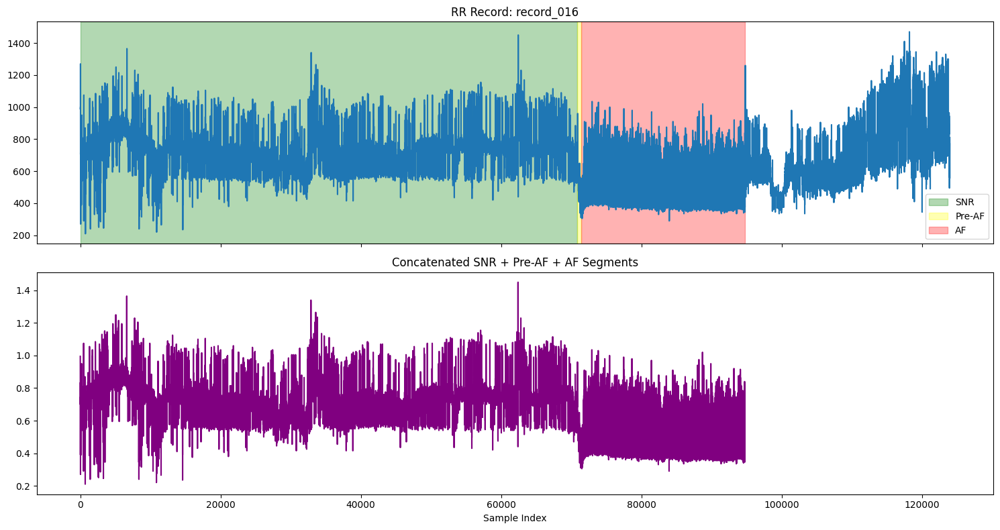

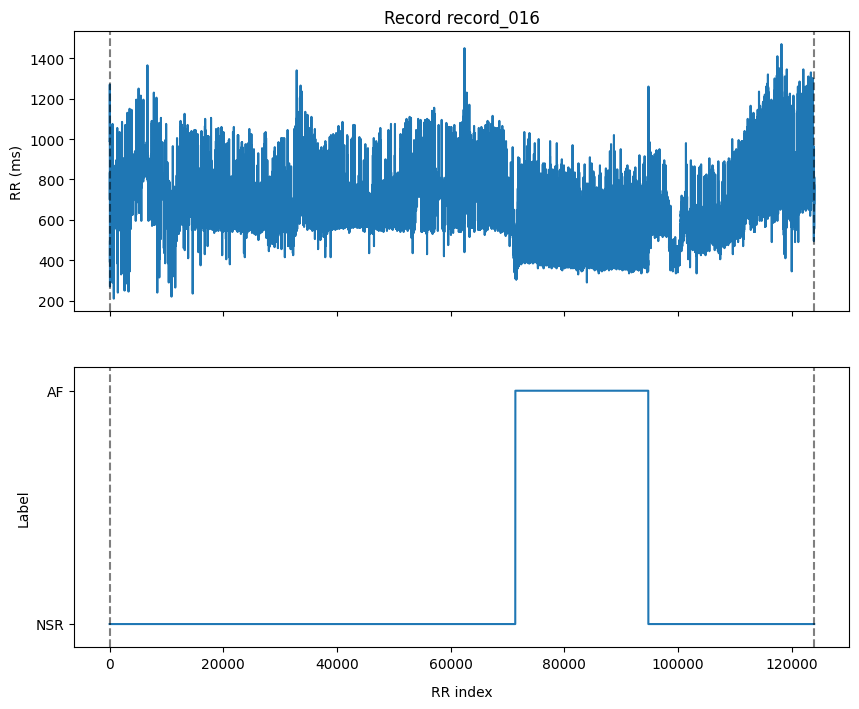

record_019


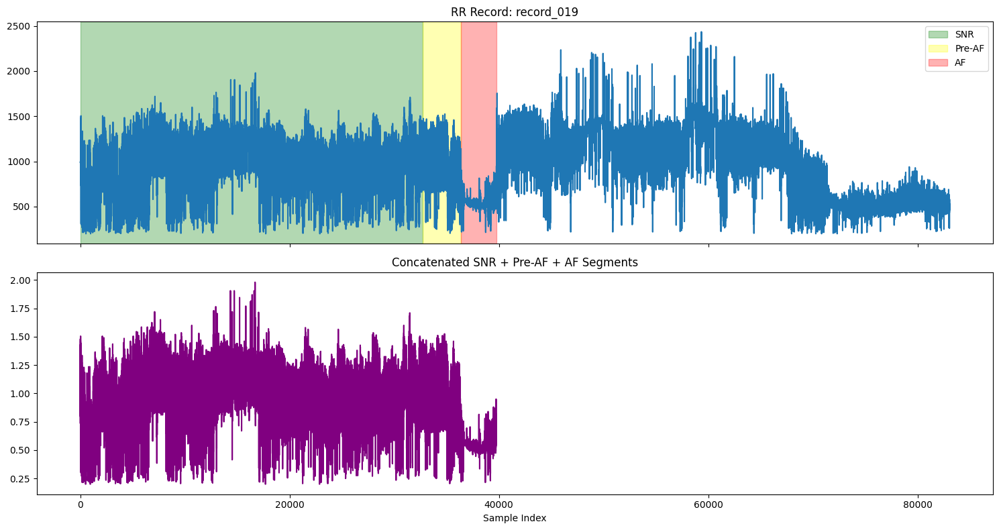

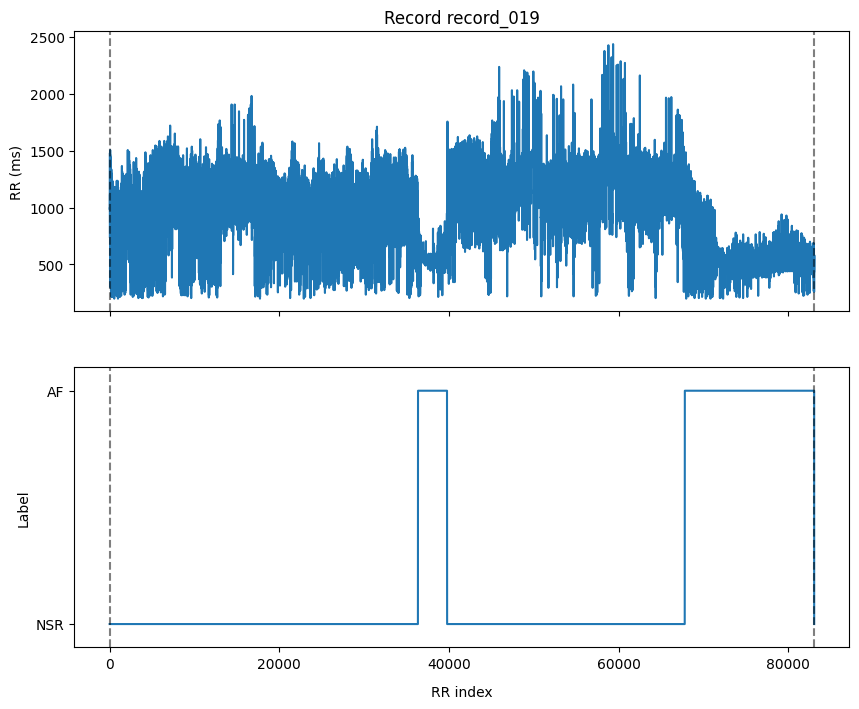

record_020


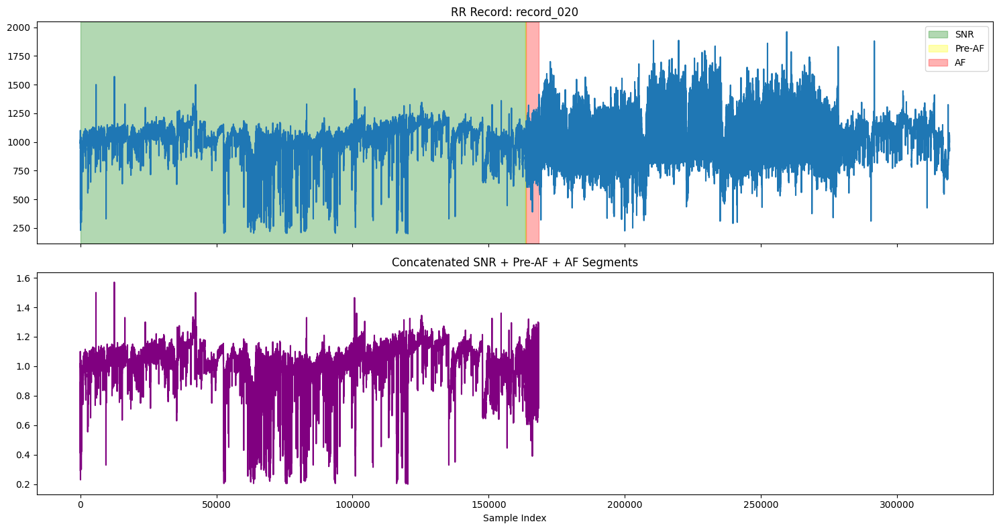

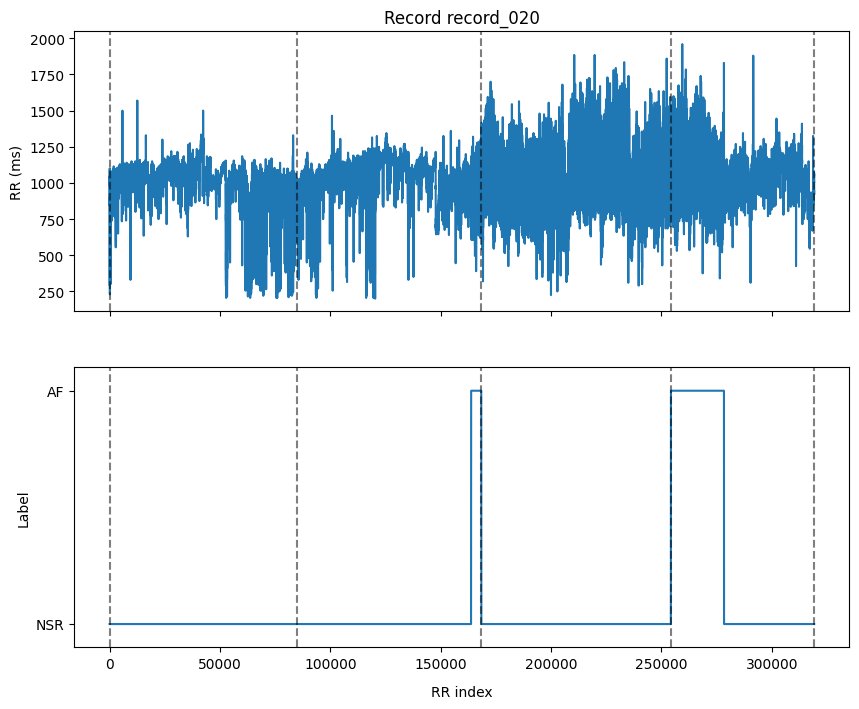

record_023


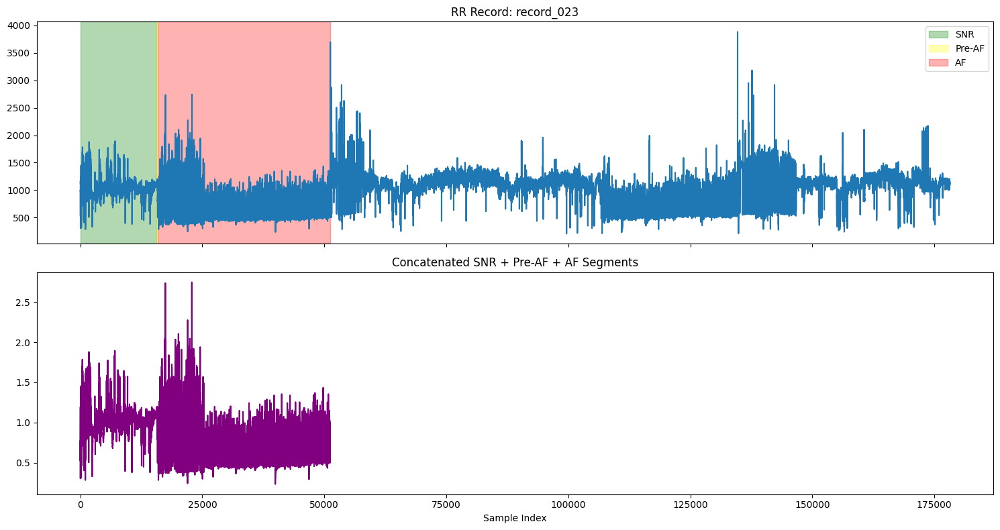

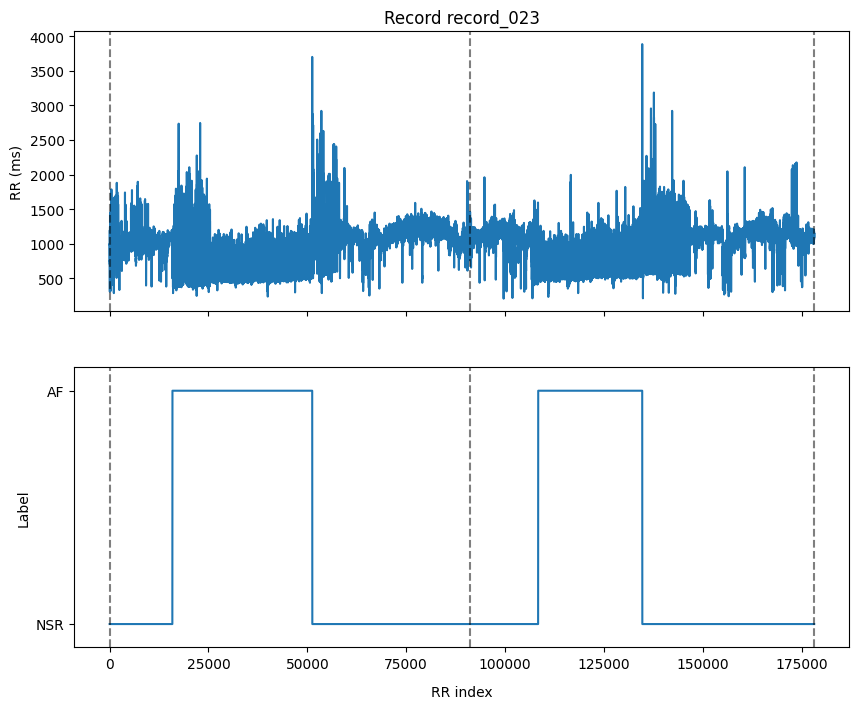

record_024


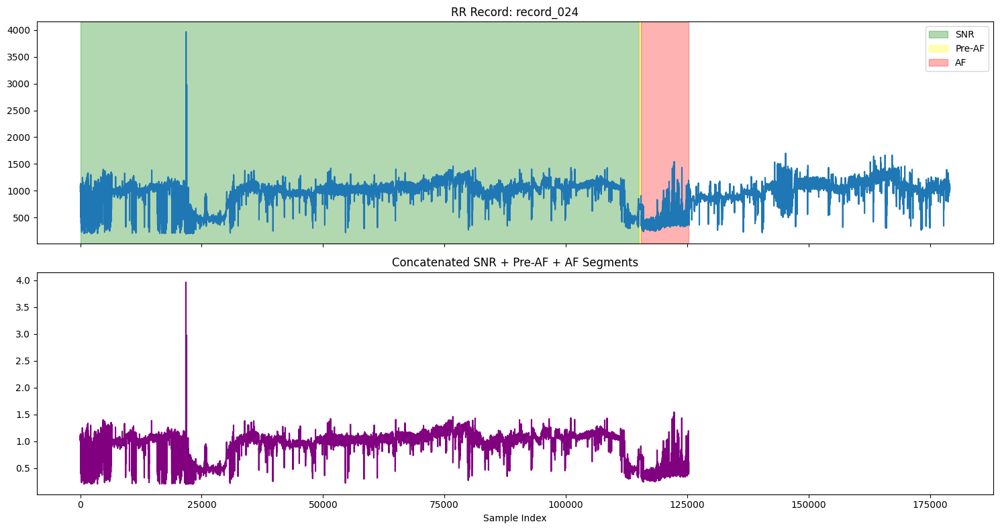

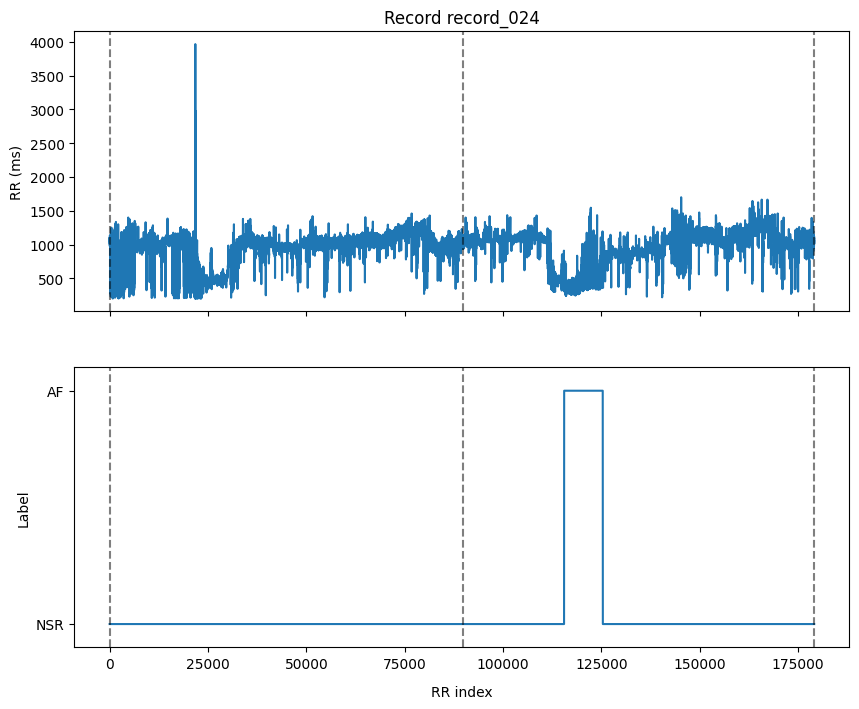

record_025


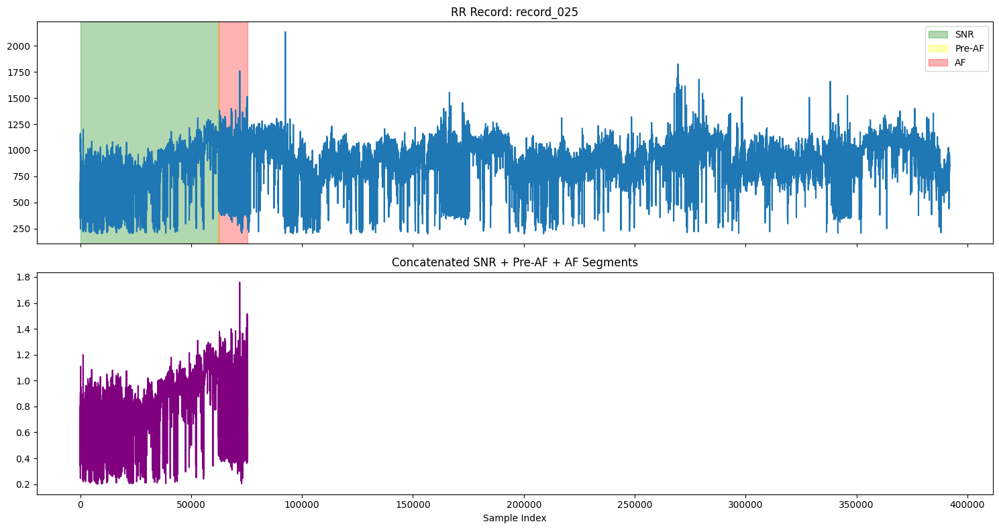

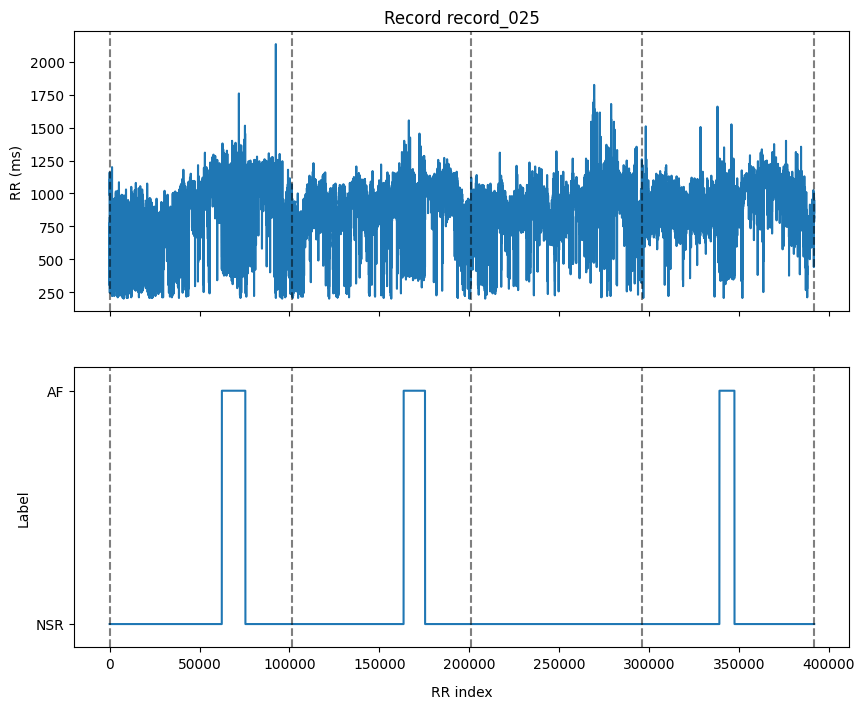

record_026


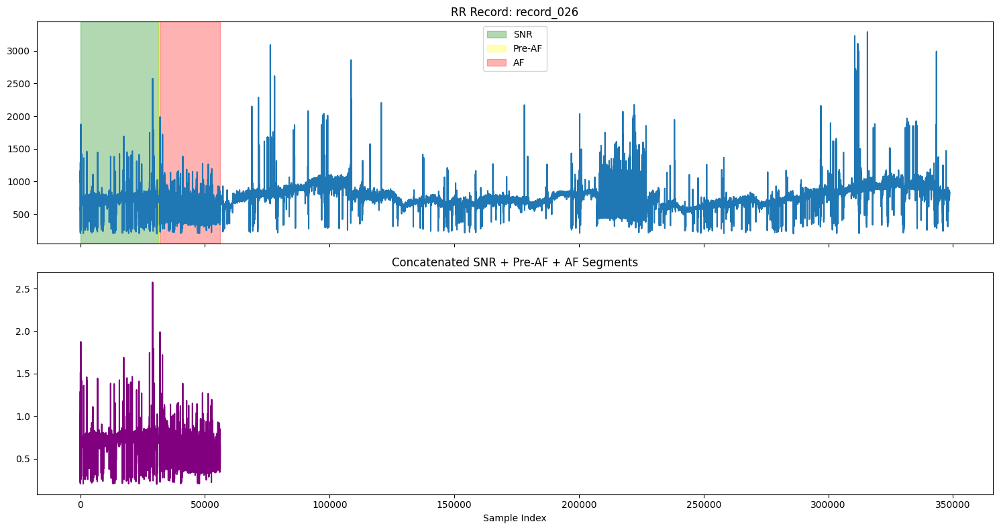

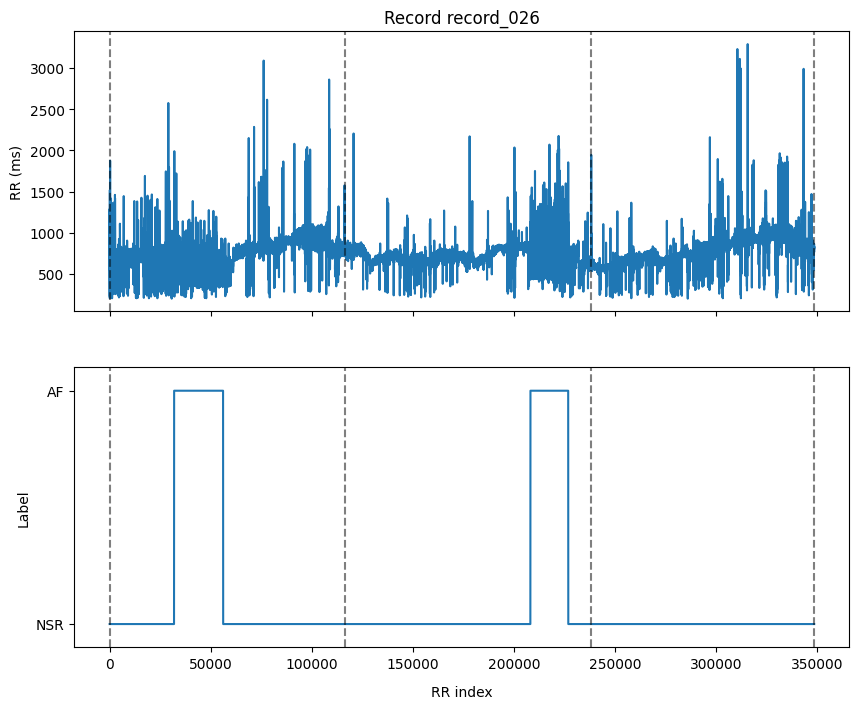

record_028


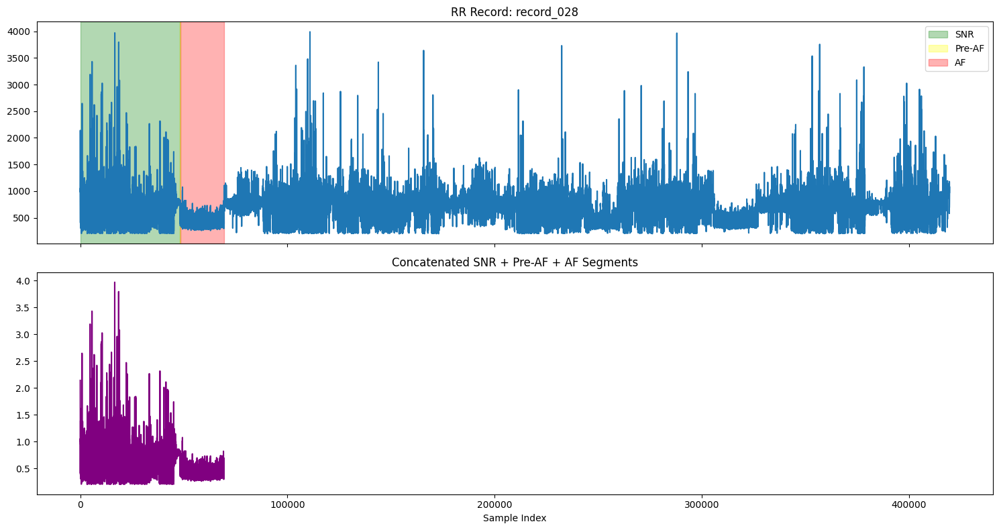

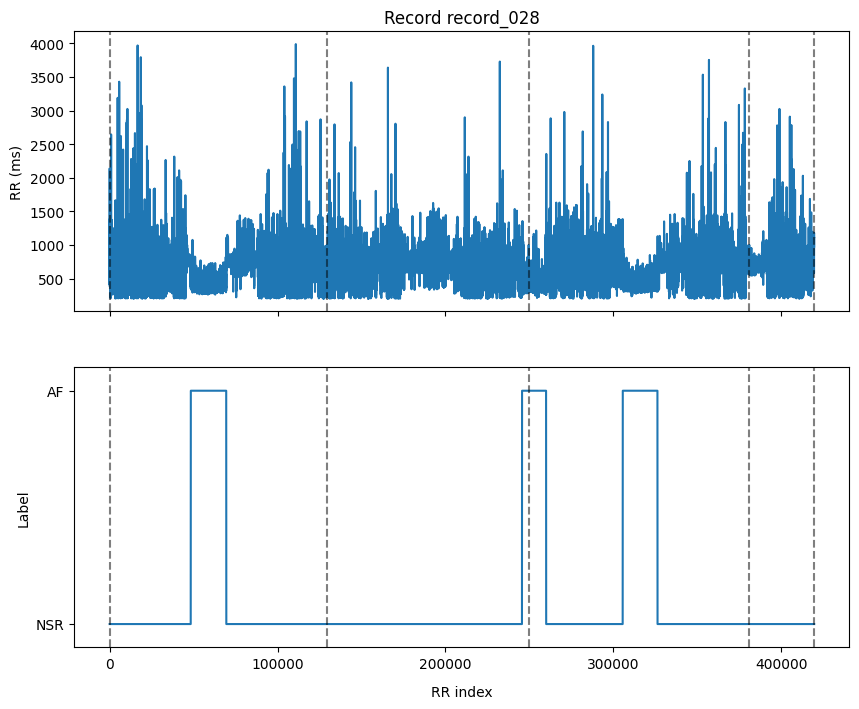

record_032


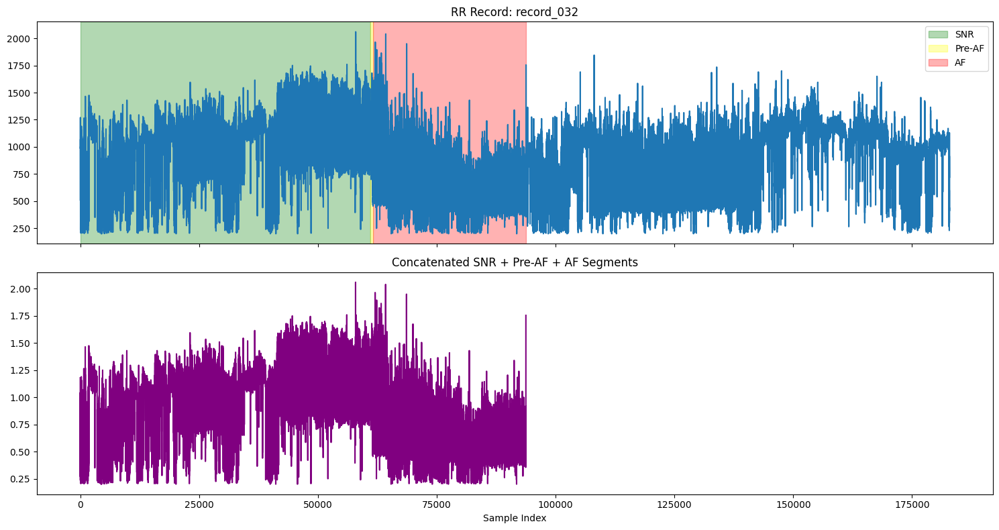

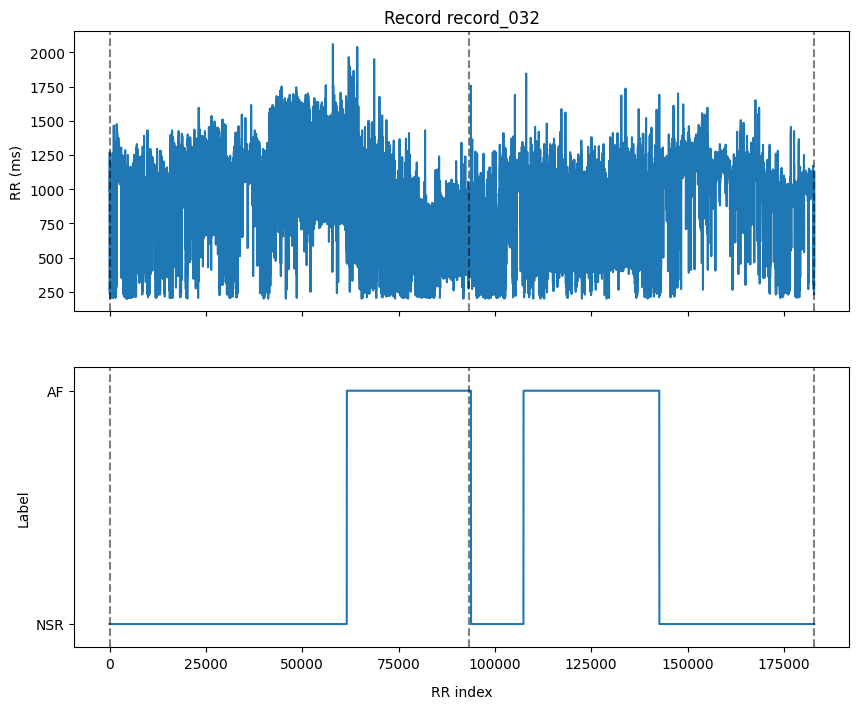

record_038


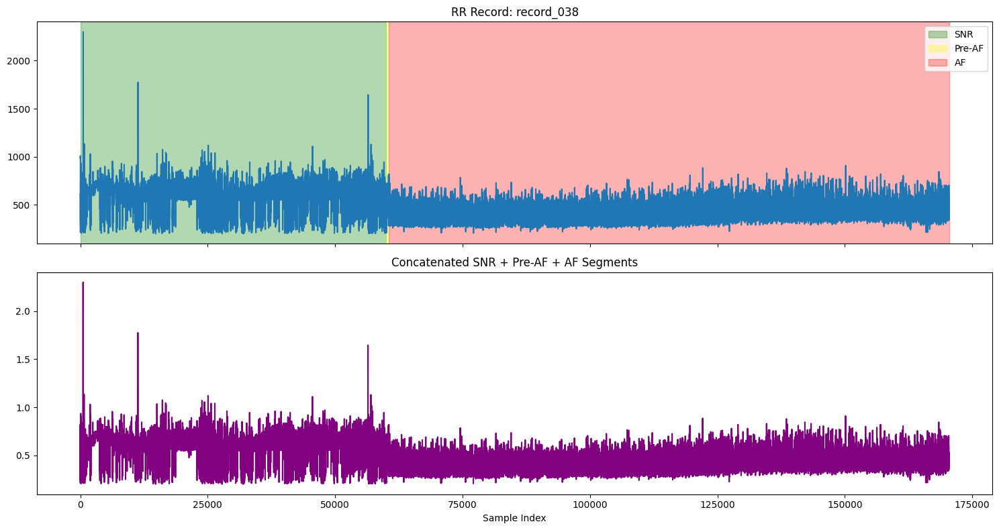

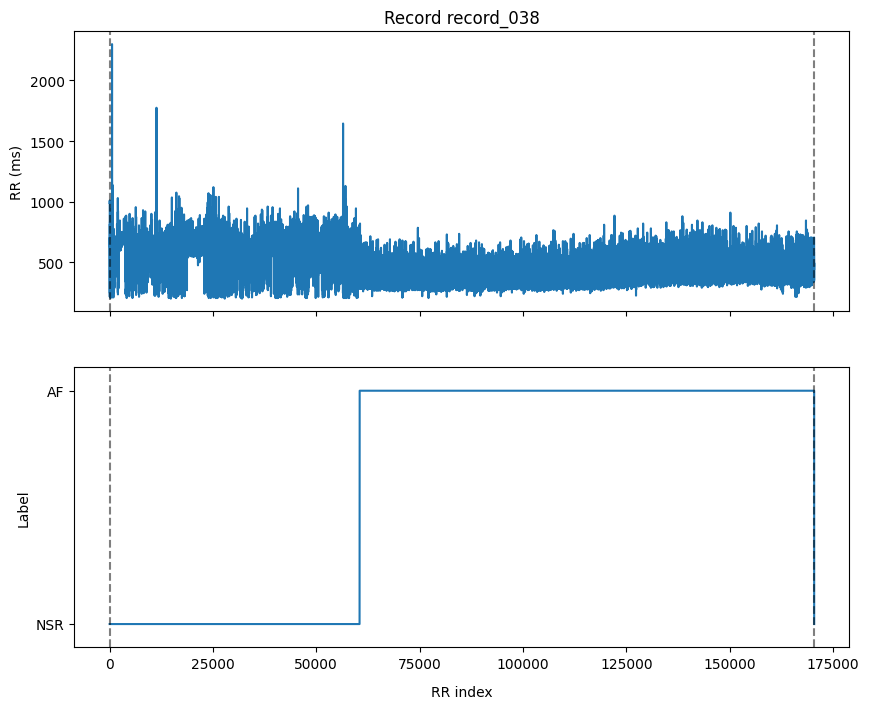

record_039


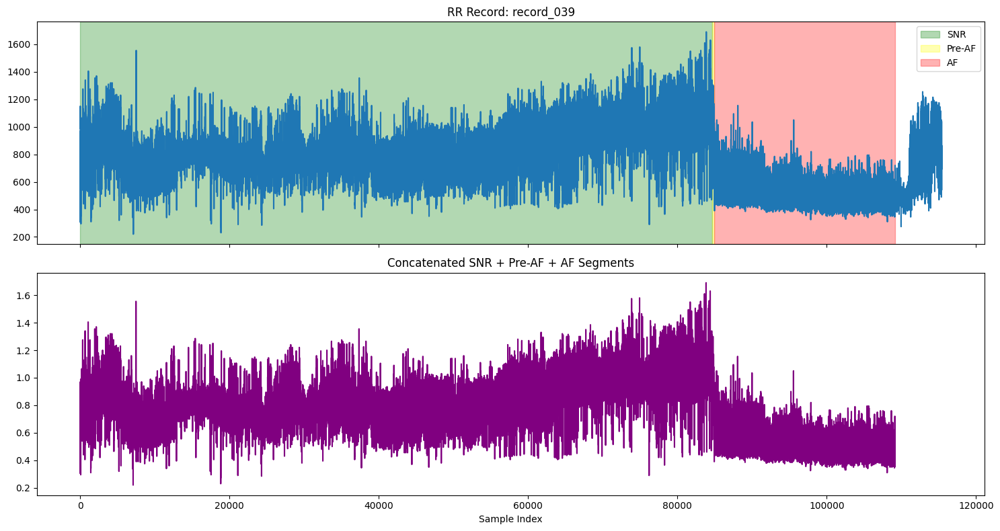

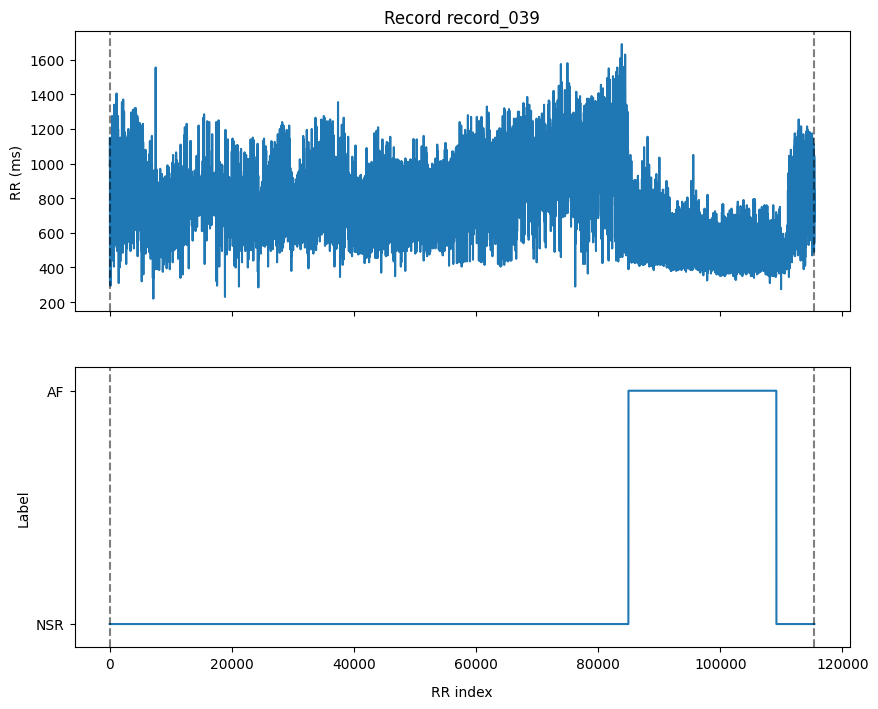

record_041


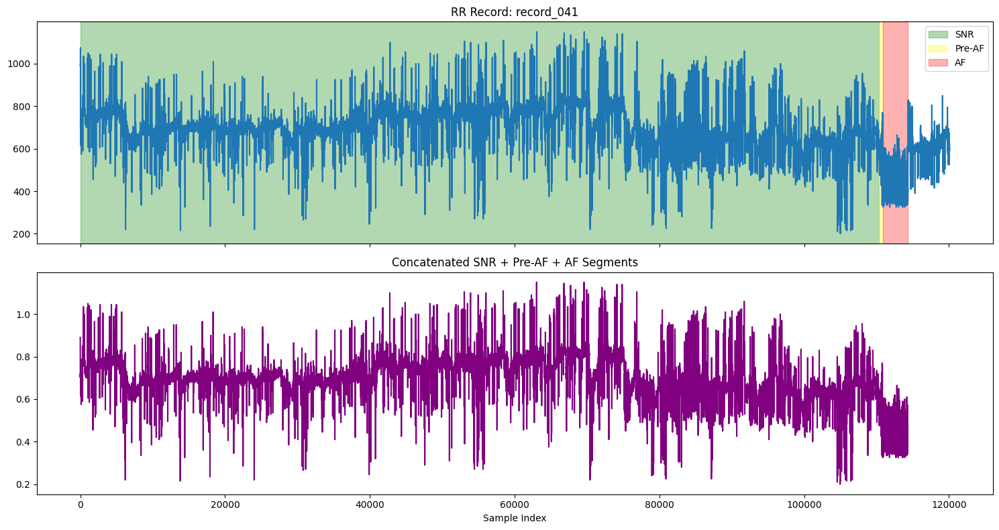

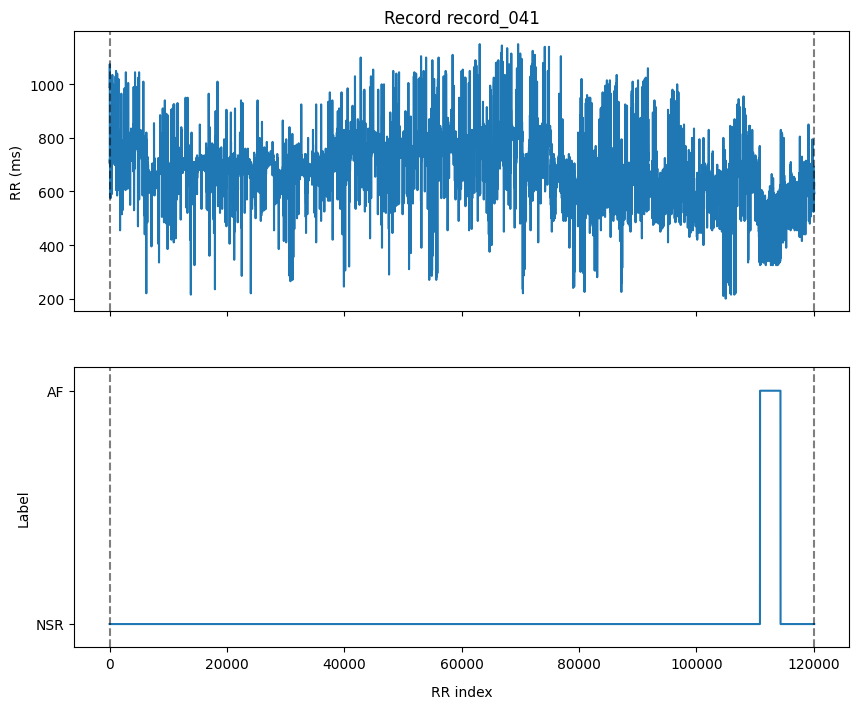

record_042


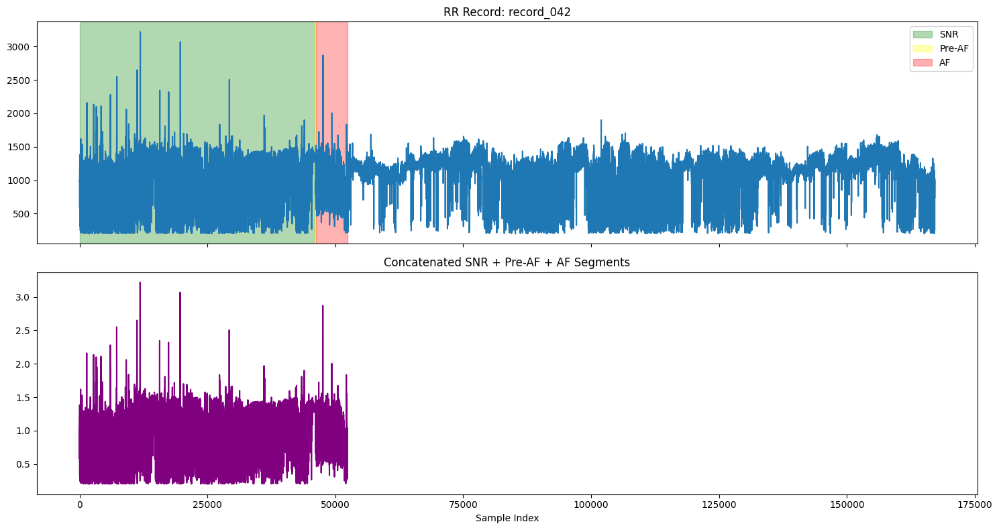

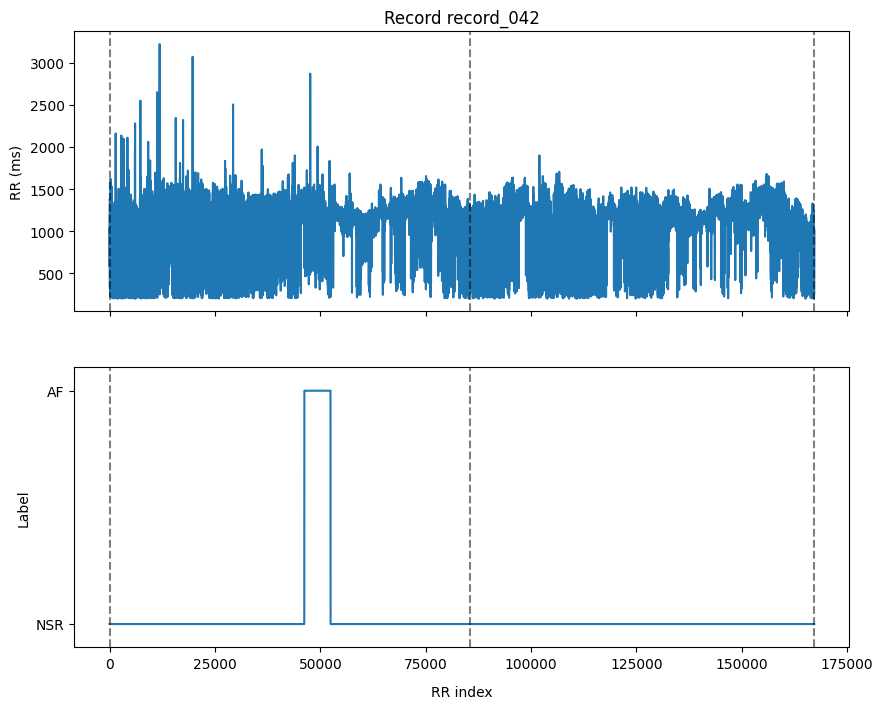

record_043


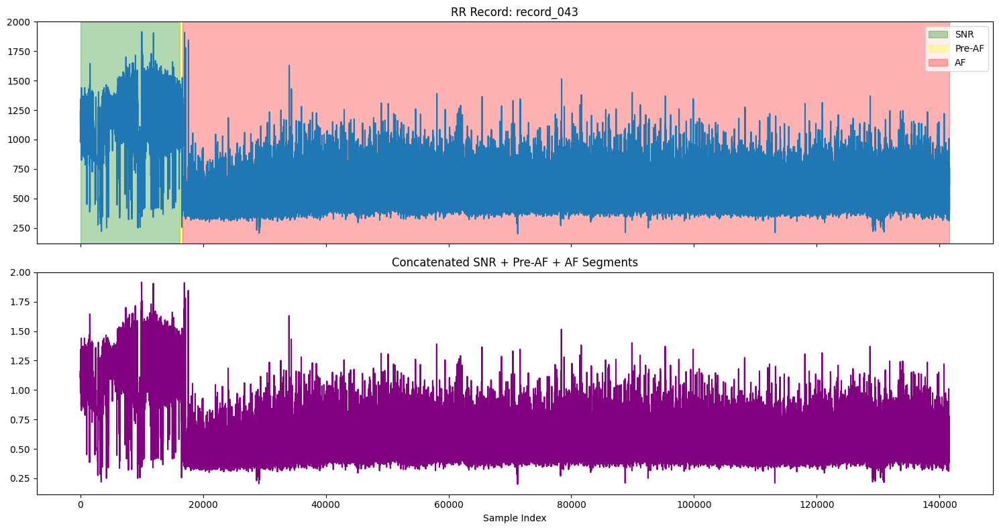

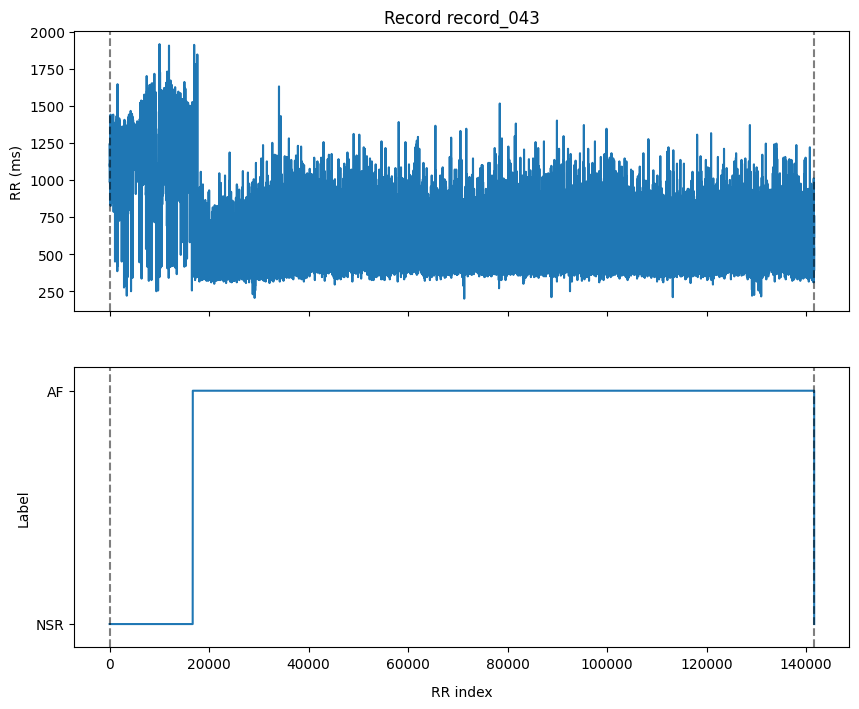

record_044


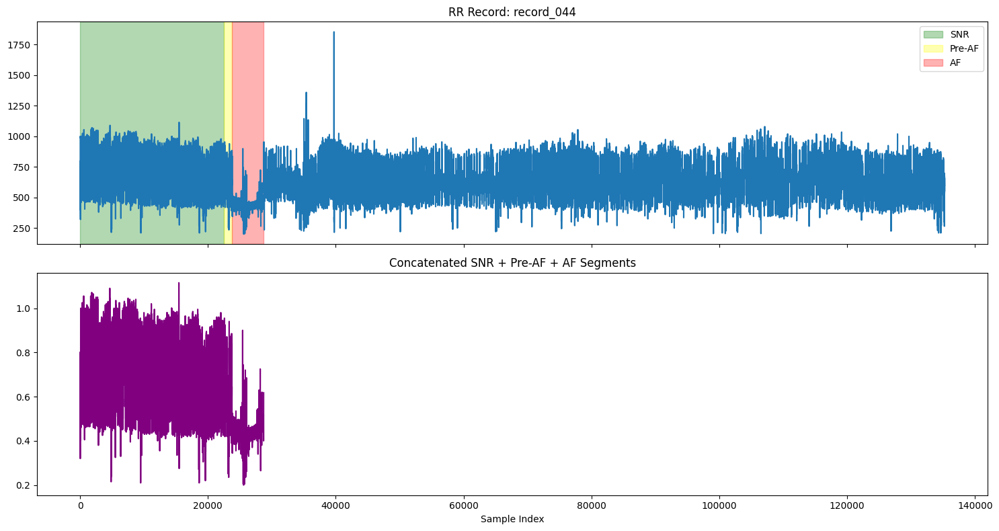

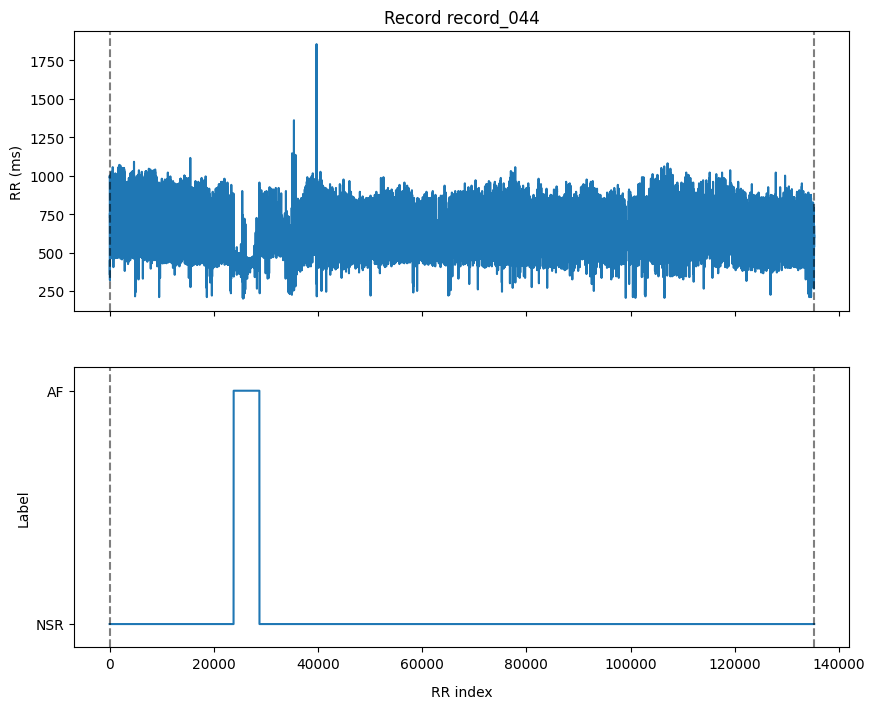

record_047


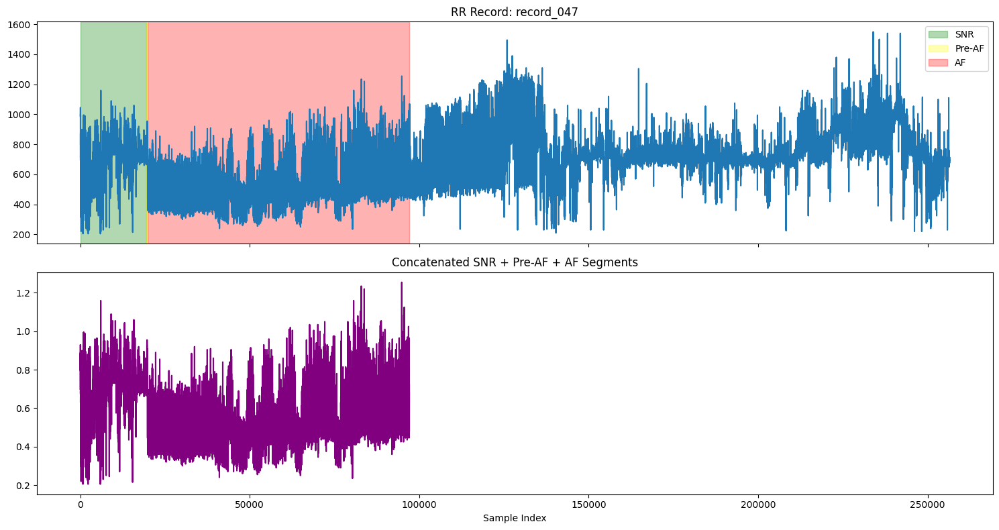

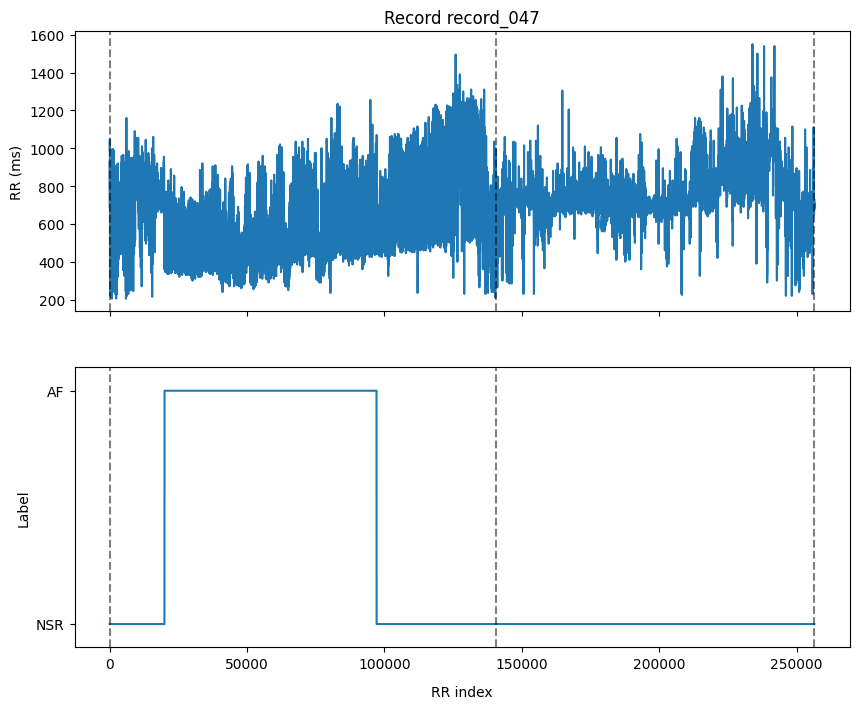

record_048


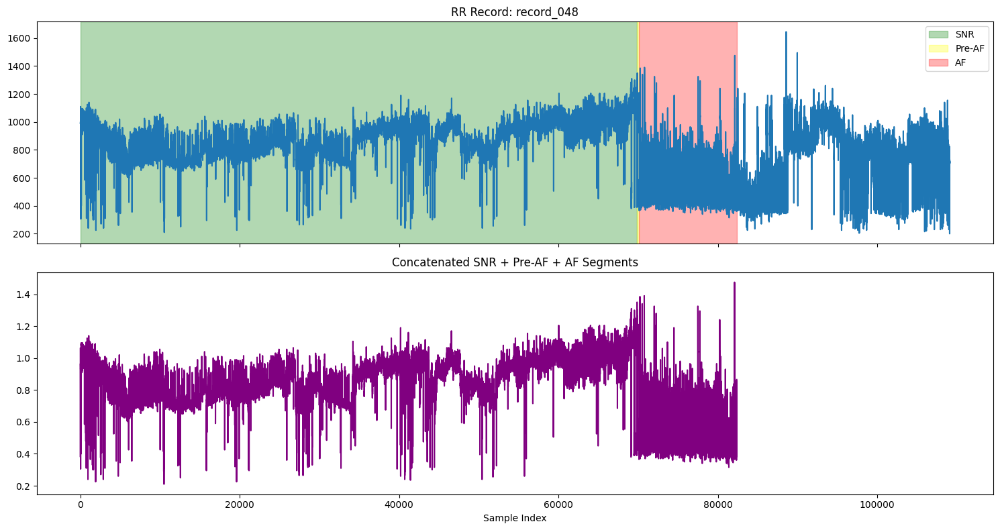

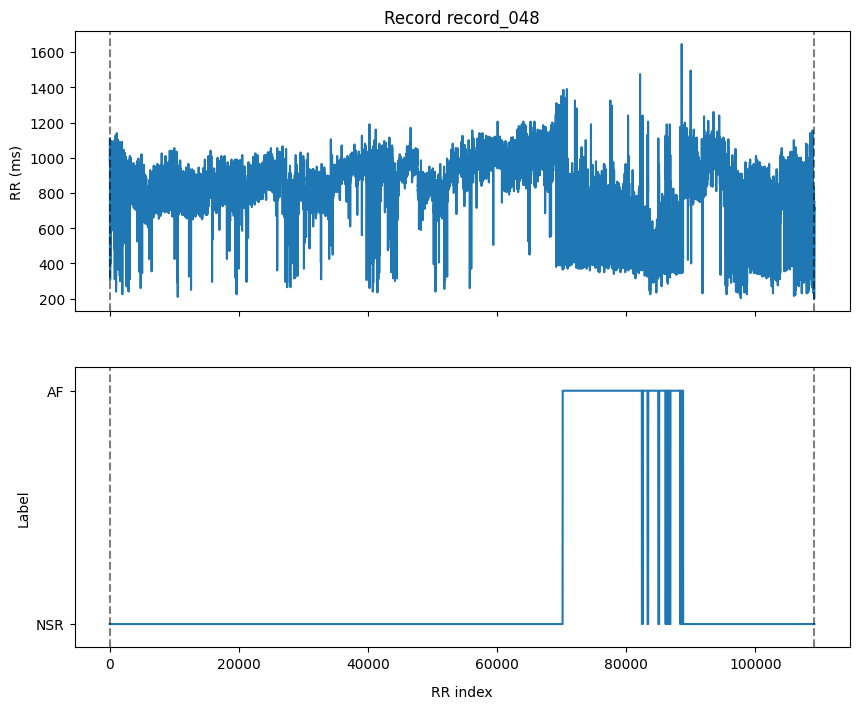

record_050


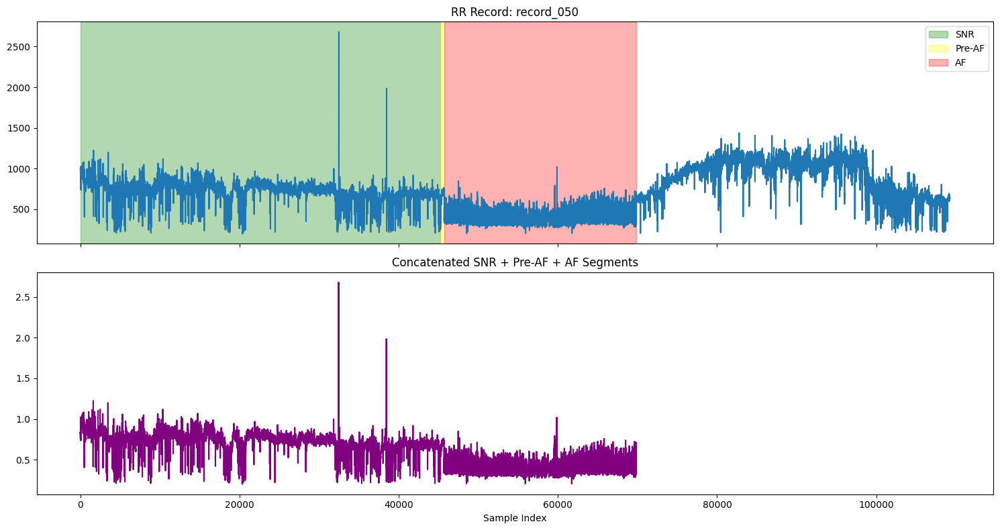

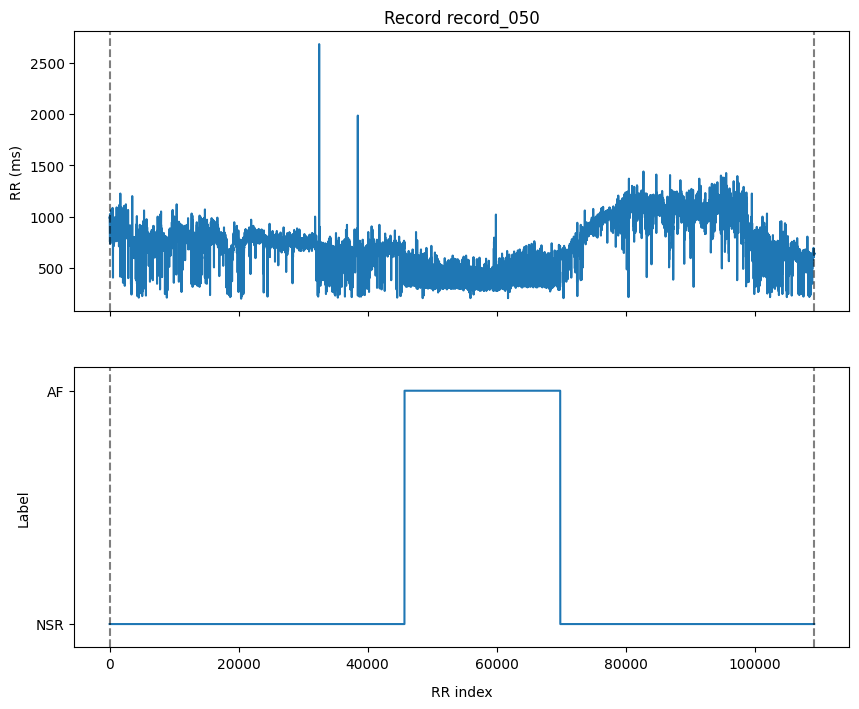

record_052


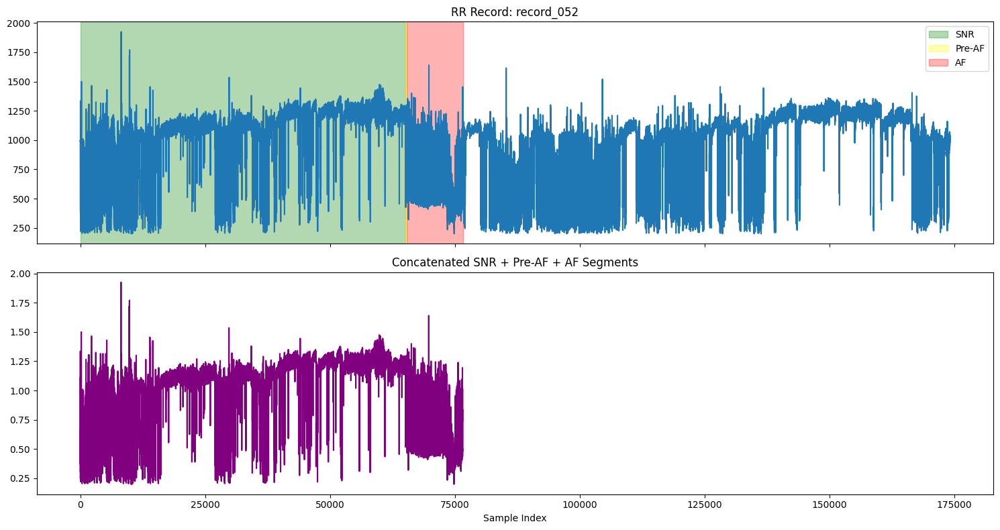

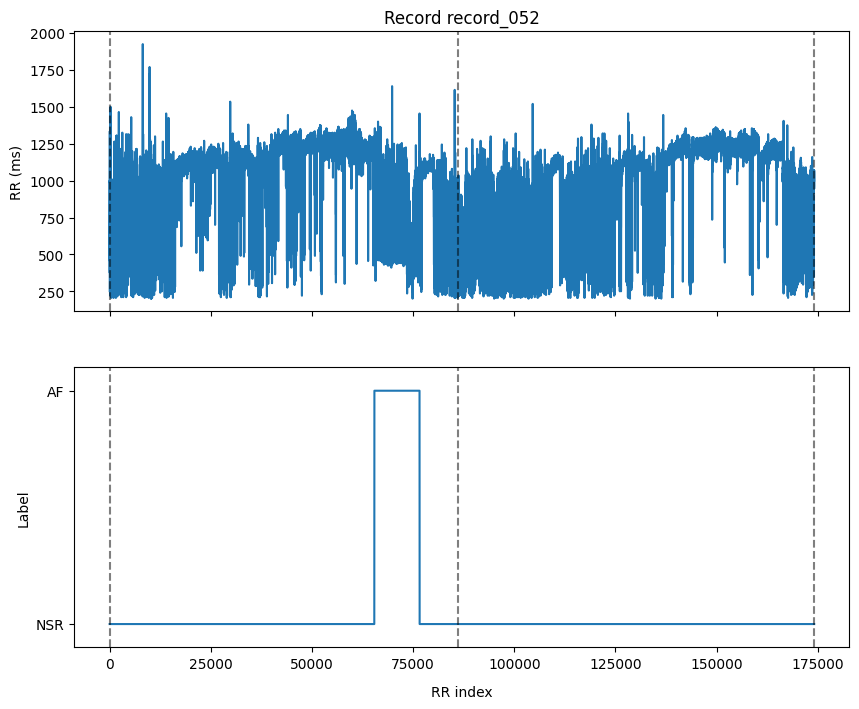

record_053


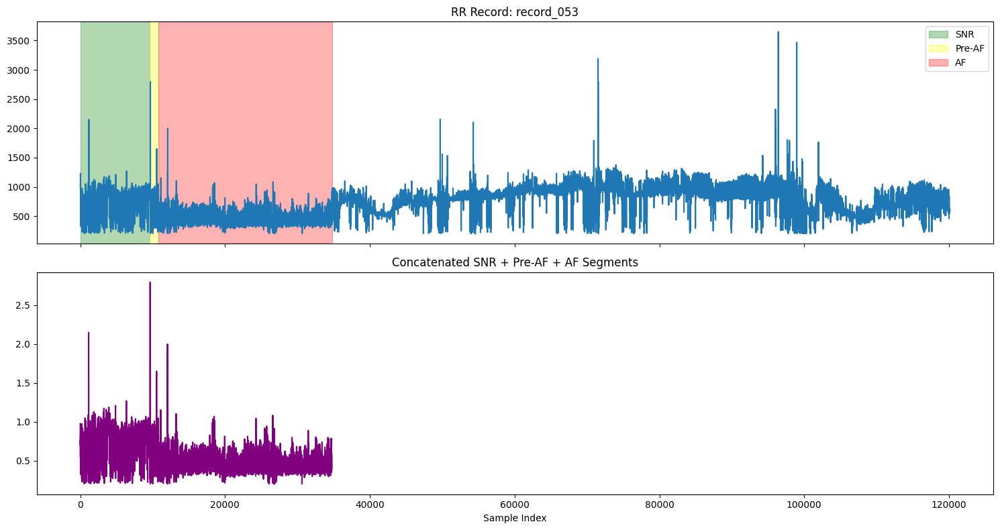

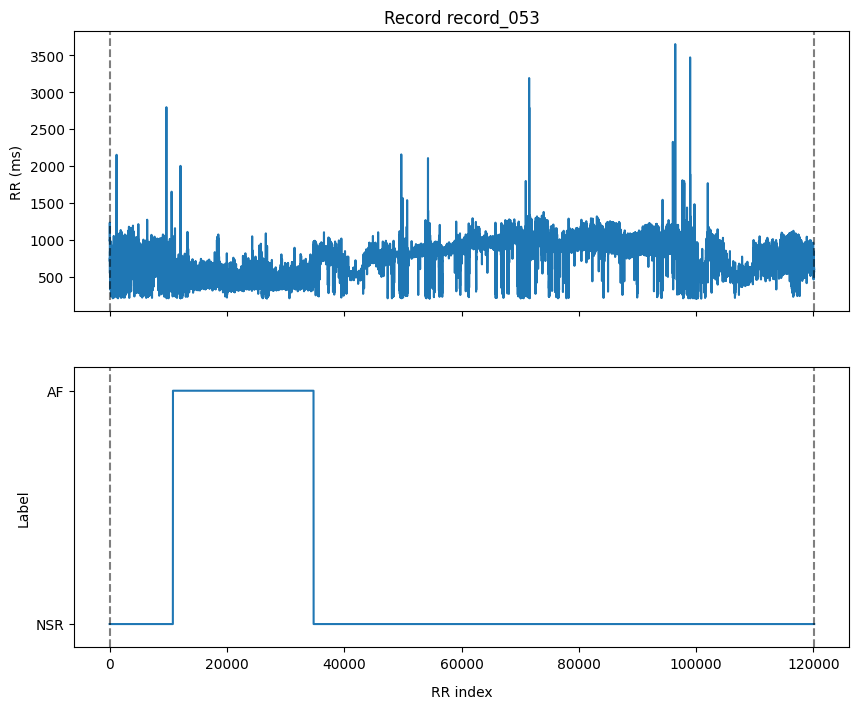

record_055


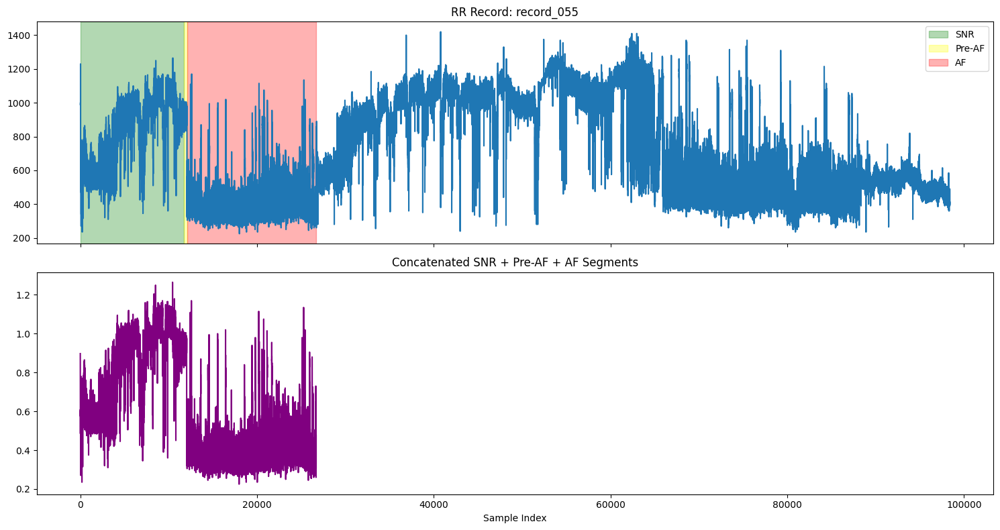

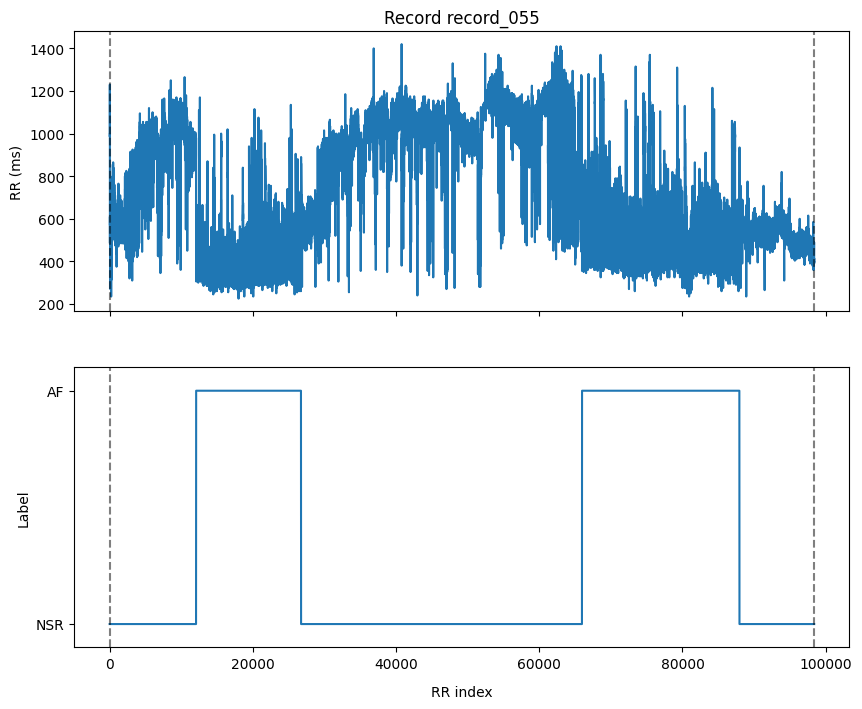

record_057


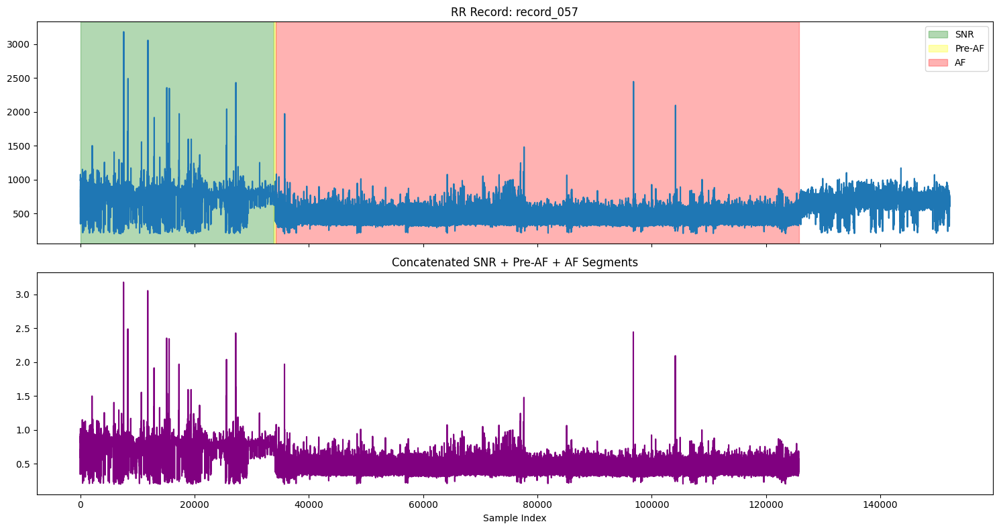

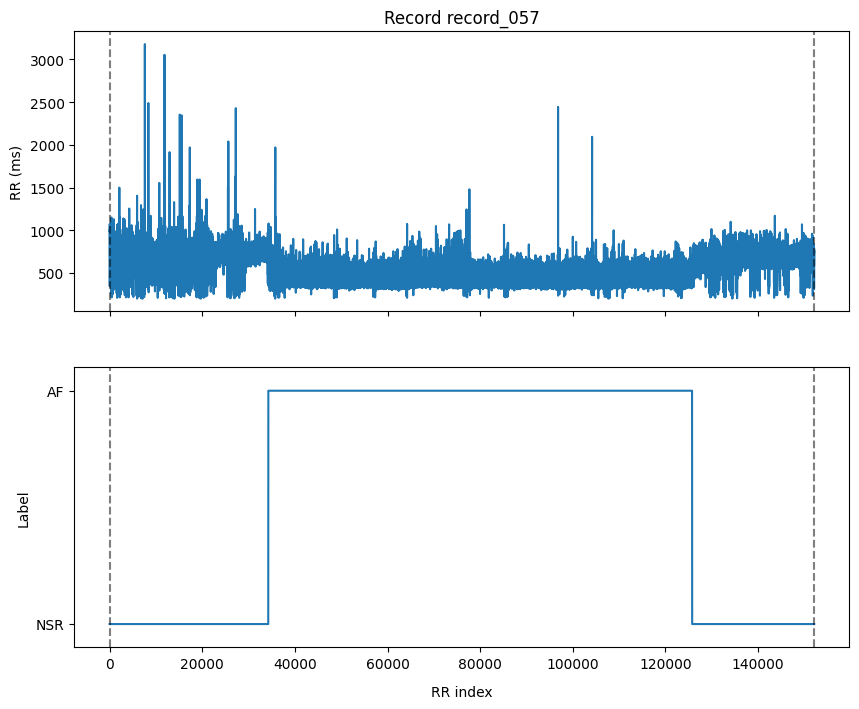

record_058


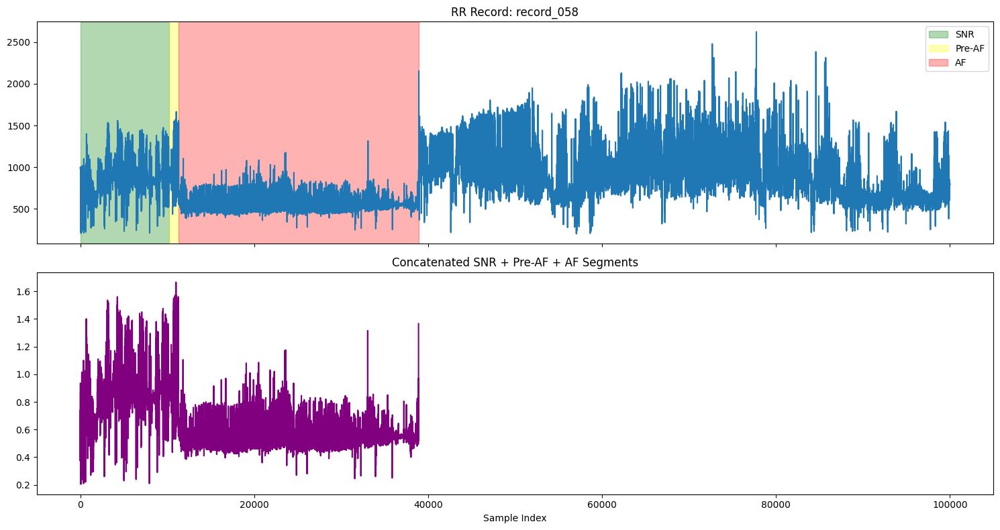

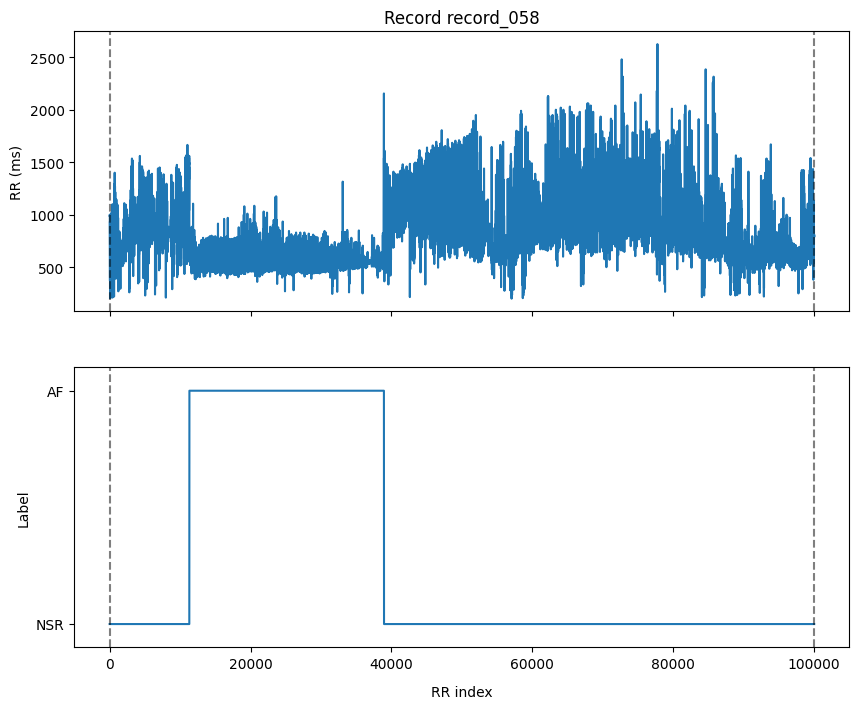

record_061


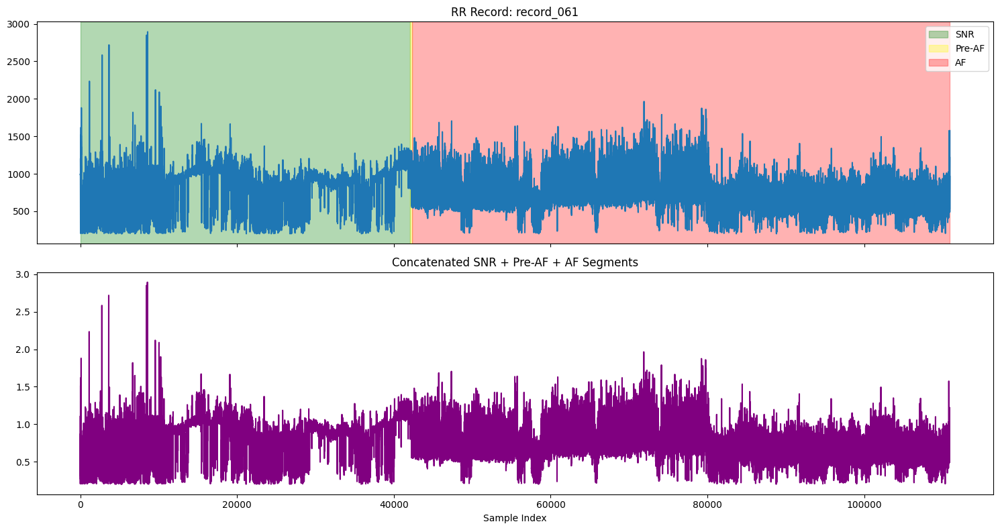

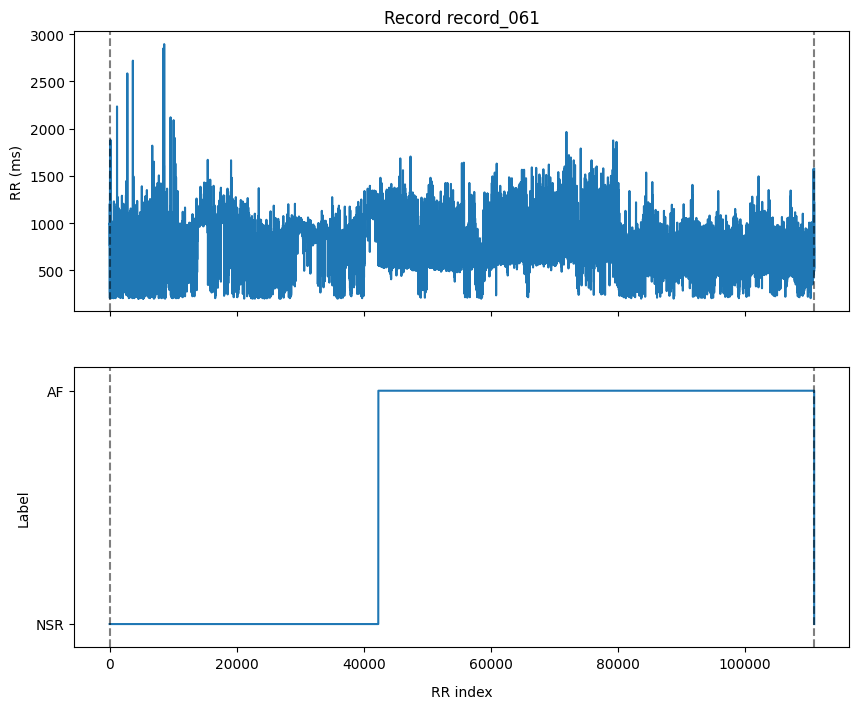

record_062


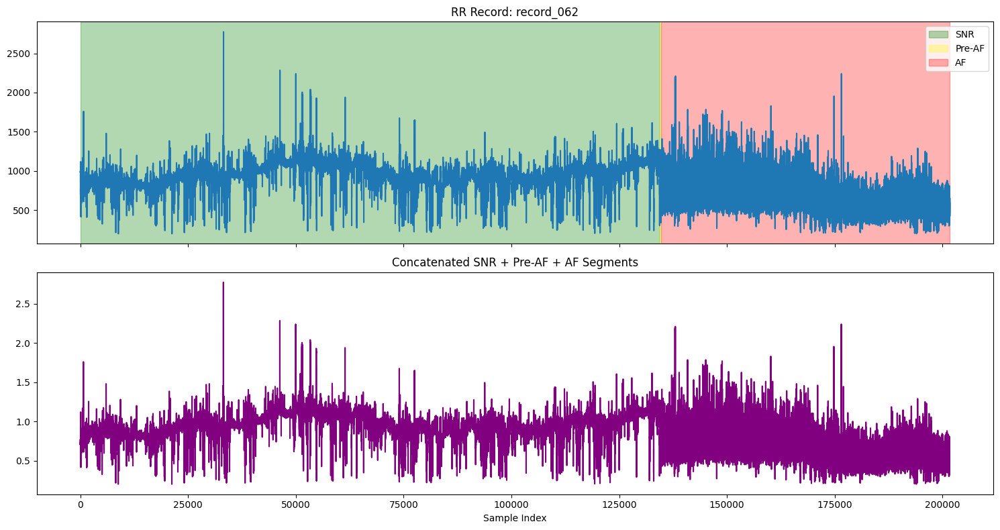

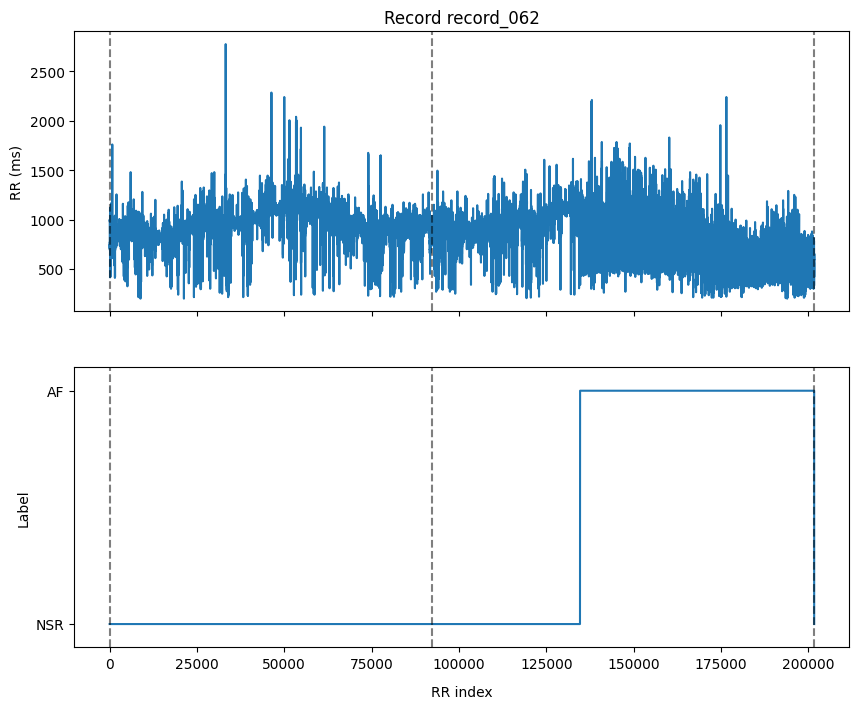

record_064


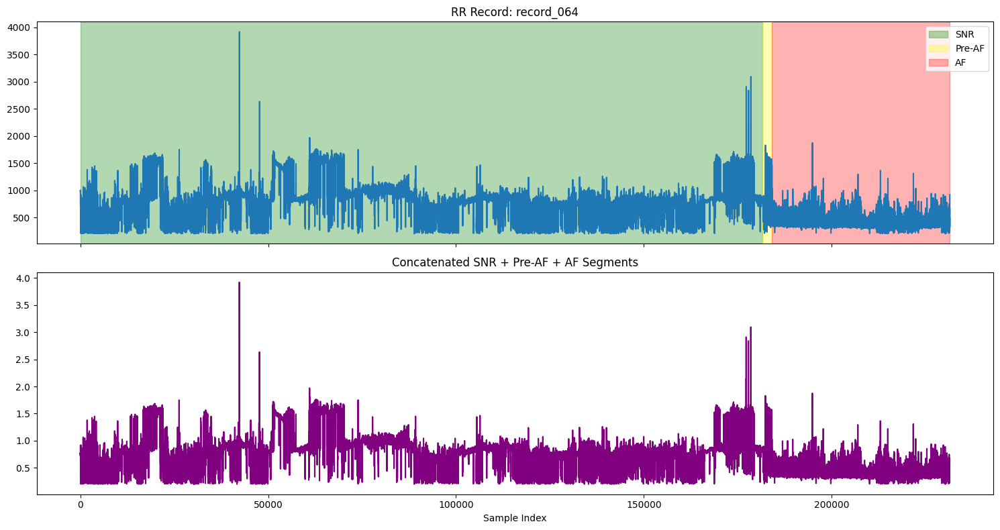

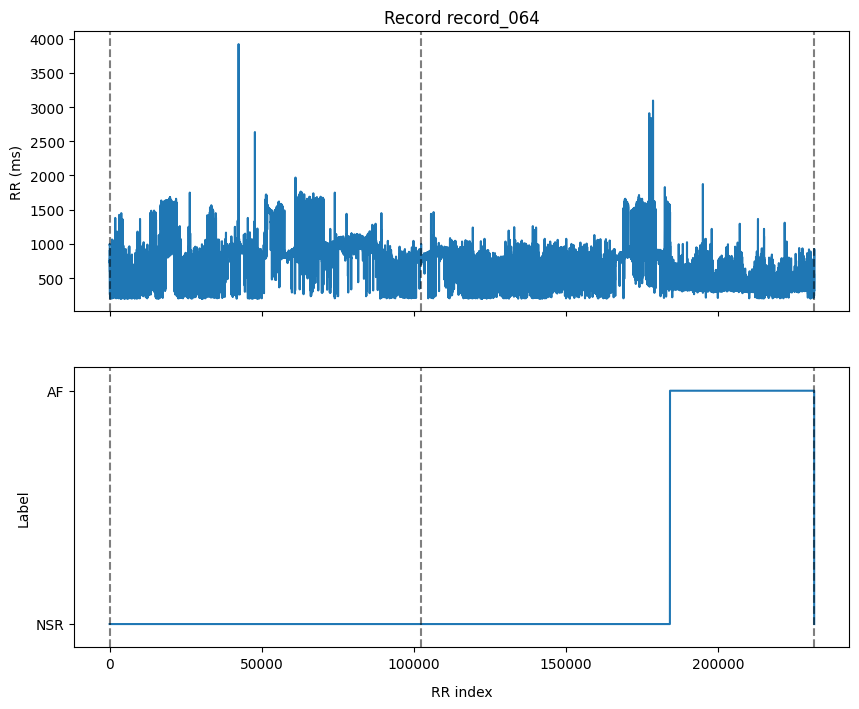

record_065


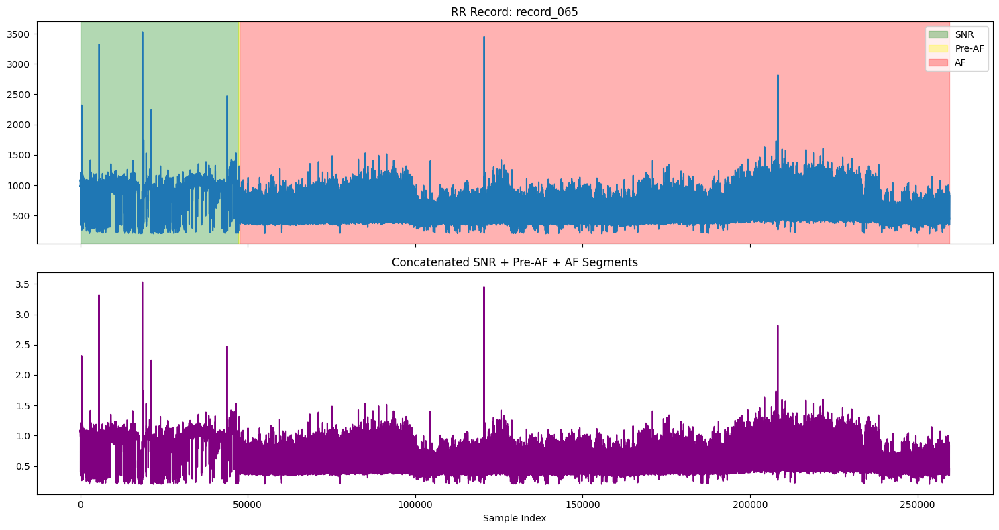

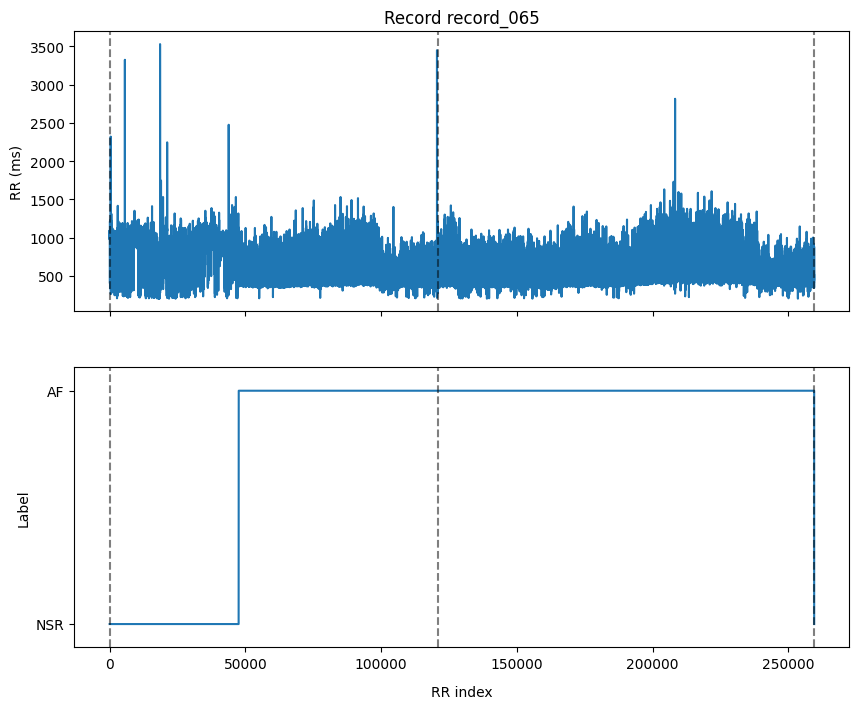

record_067


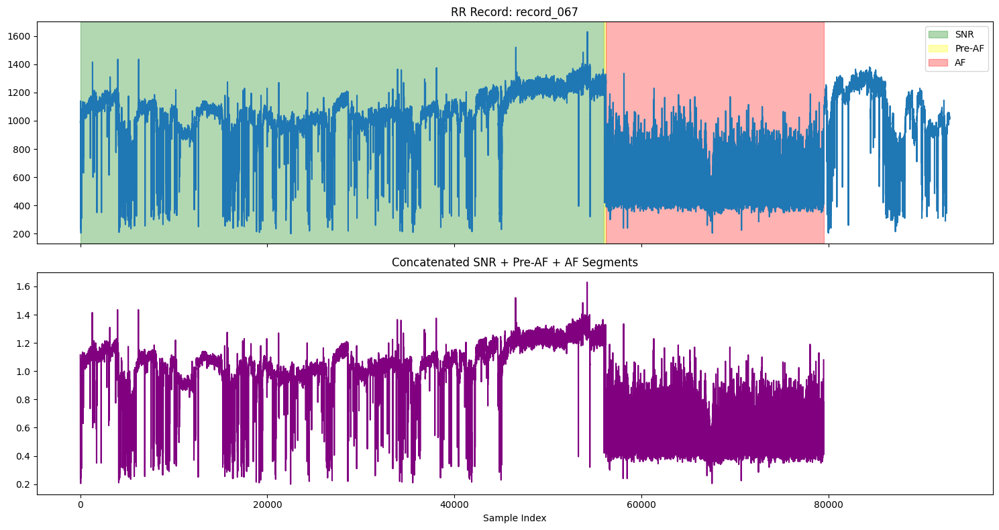

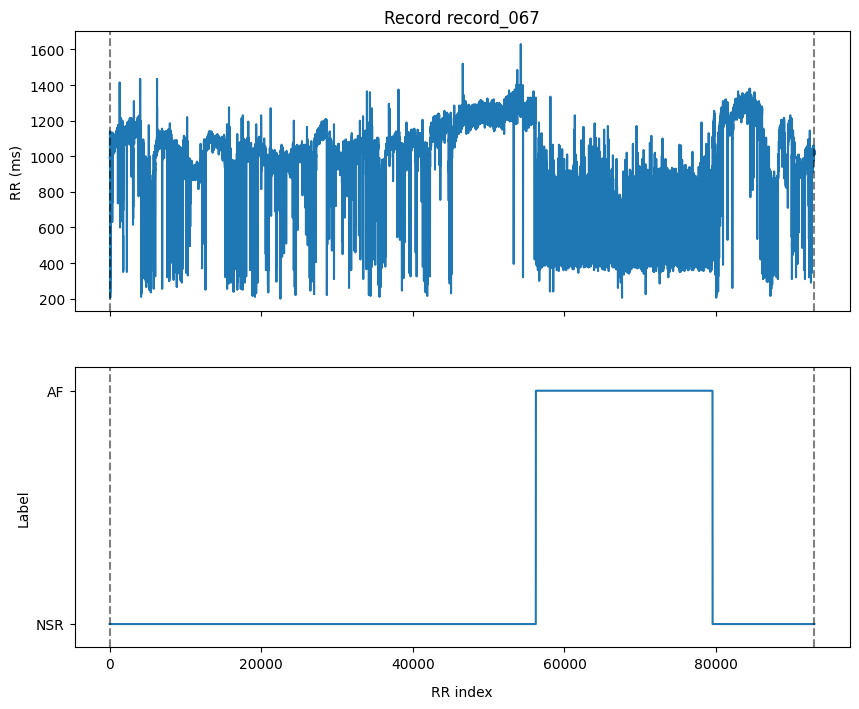

record_070


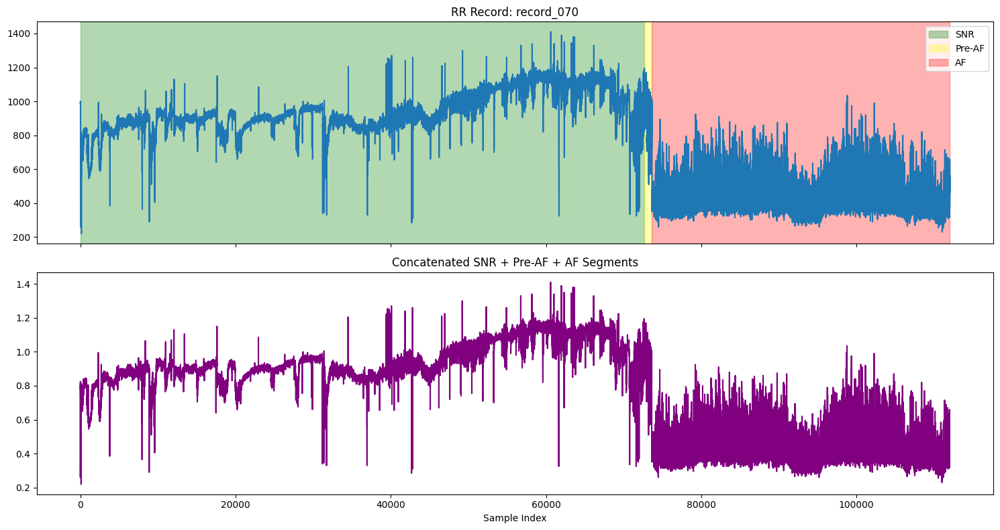

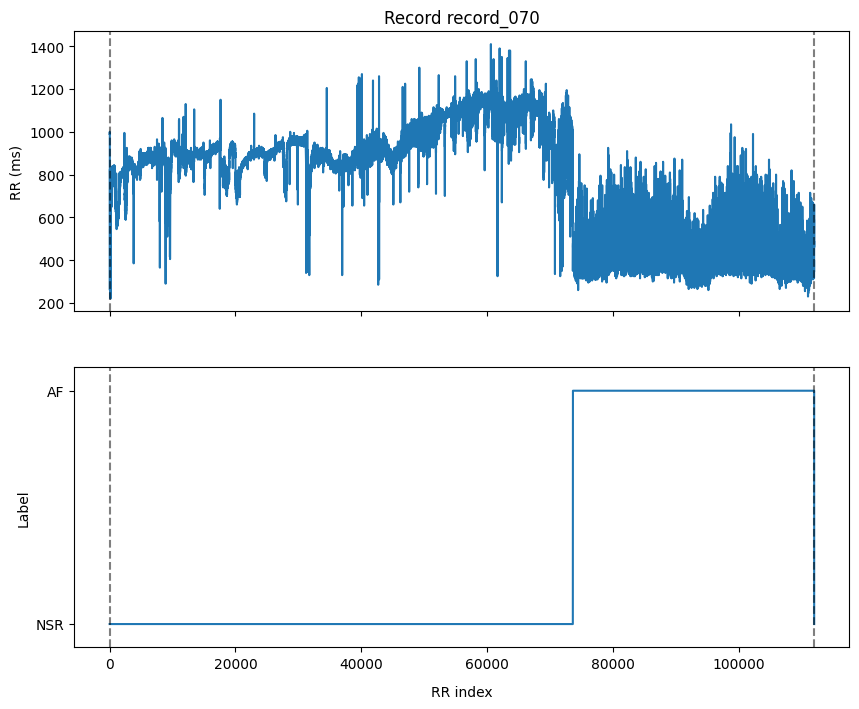

record_072


In [ ]:
for rec in rri_segments_with_pre_af:
    test = np.concatenate([
        rec['snr_signal'],
        rec['pre_af_signal'],
        rec['af_signal']
    ])
    test_record = rec['record_id']
    print(test_record)
    record = create_record(test_record, metadata_df, RECORDS_PATH)
    record.load_rr_record()
    fig, axs = plt.subplots(2, 1, figsize=(15, 8), sharex=True)

    # Top plot: full RR record with colored regions
    axs[0].plot(np.concatenate(record.rr))
    axs[0].axvspan(0, rec['pre_af_start_idx'], color='green', alpha=0.3, label='SNR')
    axs[0].axvspan(rec['pre_af_start_idx'], rec['af_start_idx'], color='yellow', alpha=0.3, label='Pre-AF')
    axs[0].axvspan(rec['af_start_idx'], rec['af_end_idx'], color='red', alpha=0.3, label='AF')
    axs[0].legend()
    axs[0].set_title(f"RR Record: {test_record}")

    # Bottom plot: concatenated test signal
    axs[1].plot(test, color='purple')
    axs[1].set_title("Concatenated SNR + Pre-AF + AF Segments")
    axs[1].set_xlabel("Sample Index")

    plt.tight_layout()
    plt.show()

    record.plot_rr()

Things observed:
- Some record have far longer pre-AF than other, mightdue to the patient have higher RRI variation than others.
- Around half of the records only have 5 min of pre-AF, this might indicate that the threshold is too high for them.
- Both observation may indicate that it is not suitable to use singel threhold to all record, can try group the record which have same RRI variation profile in future.

Text(0.5, 1.0, 'Pre-AF Duration Distribution')

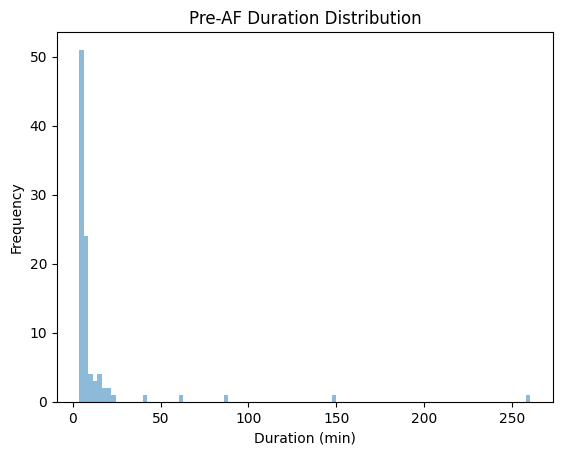

In [ ]:
# plot pre af duration distribution in minutes
plt.hist([len(rec['pre_af_signal'])/60 for rec in rri_segments_with_pre_af], bins=100, alpha=0.5, label='Pre af duration (s)')
plt.xlabel('Duration (min)')
plt.ylabel('Frequency')
plt.title('Pre-AF Duration Distribution')


# Segments SNR, pre-AF and AF into smaller segments for training.

Until here, for each record, we have a long single SNR, pre-AF and AF segment. 
We want to crop it to smaller size for model training. 
We will use the 30 sec window size with steps 5 to segment them.

In [13]:
from concurrent.futures import ThreadPoolExecutor

def count_segments(rec):
    rri_0 = split_rri_segments_to_the_end(rec['snr_signal'], window_duration_sec=30, steps_sec=5)
    rri_1 = split_rri_segments_to_the_end(rec['pre_af_signal'], window_duration_sec=30, steps_sec=5)
    rri_2 = split_rri_segments_to_the_end(rec['af_signal'], window_duration_sec=30, steps_sec=5)
    return (rec['record_id'], len(rri_0), len(rri_1), len(rri_2))

record_ids = []
num_snr_segments = []
num_pre_af_segments = []
num_af_segments = []

with ThreadPoolExecutor() as executor:
    results = list(executor.map(count_segments, rri_segments_with_pre_af))

for record_id, snr_count, pre_af_count, af_count in results:
    record_ids.append(record_id)
    num_snr_segments.append(snr_count)
    num_pre_af_segments.append(pre_af_count)
    num_af_segments.append(af_count)
    print(f"Record {record_id}: SNR segments={snr_count}, Pre-AF segments={pre_af_count}, AF segments={af_count}")


NameError: name 'rri_segments_with_pre_af' is not defined

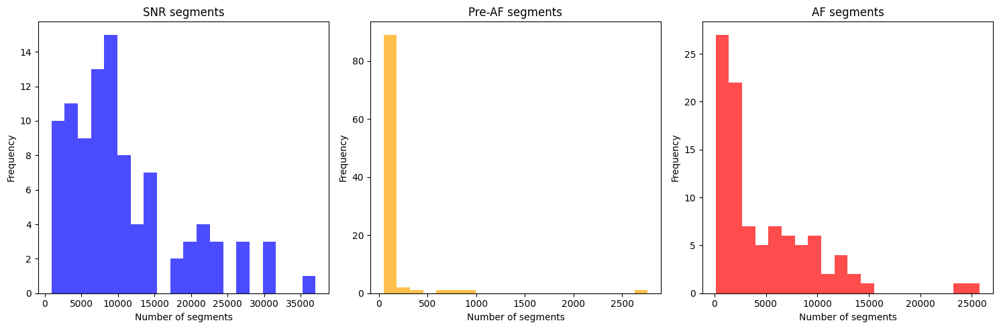

In [ ]:
# Plot histogram of num_snr_segments, num_pre_af_segments, num_af_segments in separate subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].hist(num_snr_segments, bins=20, alpha=0.7, color='blue')
axs[0].set_title('SNR segments')
axs[0].set_xlabel('Number of segments')
axs[0].set_ylabel('Frequency')

axs[1].hist(num_pre_af_segments, bins=20, alpha=0.7, color='orange')
axs[1].set_title('Pre-AF segments')
axs[1].set_xlabel('Number of segments')
axs[1].set_ylabel('Frequency')

axs[2].hist(num_af_segments, bins=20, alpha=0.7, color='red')
axs[2].set_title('AF segments')
axs[2].set_xlabel('Number of segments')
axs[2].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

In [ ]:
# min max number of segments among all records
print("SNR segments: min =", min(num_snr_segments), ", max =", max(num_snr_segments), ", mean =", np.mean(num_snr_segments))
print("Pre-AF segments: min =", min(num_pre_af_segments), ", max =", max(num_pre_af_segments), ", mean =", np.mean(num_pre_af_segments))
print("AF segments: min =", min(num_af_segments), ", max =", max(num_af_segments), ", mean =", np.mean(num_af_segments))

SNR segments: min = 895 , max = 37054 , mean = 10800.15625
Pre-AF segments: min = 46 , max = 2761 , mean = 121.16666666666667
AF segments: min = 118 , max = 25772 , mean = 4753.625


From above, we can see again that most of the record have low pre-AF segments. To keep our dataset balance and not skew to record who have longer segments, we will cap the segments each record can contribute to 50 by random selection. 

In [ ]:
import random
from concurrent.futures import ThreadPoolExecutor

balanced_rri_segments = []
MAX_SEGMENTS = 50

rri_segments_with_pre_af = np.load("save_files/rri_segments_with_pre_af.npy", allow_pickle=True).tolist()

def process_record(rec):
    record_id = rec['record_id']
    snr_segments = split_rri_segments_to_the_end(rec['snr_signal'], window_duration_sec=30, steps_sec=5)
    pre_af_segments = split_rri_segments_to_the_end(rec['pre_af_signal'], window_duration_sec=30, steps_sec=5)
    af_segments = split_rri_segments_to_the_end(rec['af_signal'], window_duration_sec=30, steps_sec=5)

    selected_preaf = random.sample(pre_af_segments, min(len(pre_af_segments), MAX_SEGMENTS))
    selected_snr = random.sample(snr_segments, min(len(snr_segments), MAX_SEGMENTS))
    selected_af = random.sample(af_segments, min(len(af_segments), MAX_SEGMENTS))

    print(f"Record {record_id}: Balanced SNR={len(selected_snr)}, Pre-AF={len(selected_preaf)}, AF={len(selected_af)}")
    return {
        "patient_id": rec['patient_id'],
        "record_id": record_id,
        "snr": selected_snr,
        "pre_af": selected_preaf,
        "af": selected_af
    }

with ThreadPoolExecutor() as executor:
    balanced_rri_segments = list(executor.map(process_record, rri_segments_with_pre_af))

# Sort the balanced records by record_id
balanced_rri_segments = sorted(balanced_rri_segments, key=lambda x: x['record_id'])
np.save("save_files/balanced_rri_segments.npy", np.array(balanced_rri_segments))

Record record_015: Balanced SNR=50, Pre-AF=50, AF=50
Record record_019: Balanced SNR=50, Pre-AF=50, AF=50
Record record_000: Balanced SNR=50, Pre-AF=50, AF=50
Record record_001: Balanced SNR=50, Pre-AF=50, AF=50
Record record_002: Balanced SNR=50, Pre-AF=50, AF=50
Record record_005: Balanced SNR=50, Pre-AF=50, AF=50
Record record_016: Balanced SNR=50, Pre-AF=50, AF=50
Record record_023: Balanced SNR=50, Pre-AF=49, AF=50
Record record_003: Balanced SNR=50, Pre-AF=49, AF=50
Record record_004: Balanced SNR=50, Pre-AF=50, AF=50
Record record_007: Balanced SNR=50, Pre-AF=50, AF=50
Record record_012: Balanced SNR=50, Pre-AF=50, AF=50
Record record_009: Balanced SNR=50, Pre-AF=50, AF=50
Record record_026: Balanced SNR=50, Pre-AF=50, AF=50
Record record_008: Balanced SNR=50, Pre-AF=48, AF=50
Record record_028: Balanced SNR=50, Pre-AF=49, AF=50
Record record_044: Balanced SNR=50, Pre-AF=50, AF=50
Record record_025: Balanced SNR=50, Pre-AF=50, AF=50
Record record_011: Balanced SNR=50, Pre-AF=50,

In [ ]:
import numpy as np
balanced_rri_segments = np.load("save_files/balanced_rri_segments.npy", allow_pickle=True).tolist()

In [ ]:
num_af_segments = 0
num_pre_af_segments = 0
num_snr_segments = 0

for rec in balanced_rri_segments:
    num_af_segments += len(rec['af'])
    num_pre_af_segments += len(rec['pre_af'])
    num_snr_segments += len(rec['snr'])

print("Total segments - SNR:", num_snr_segments, ", Pre-AF:", num_pre_af_segments, ", AF:", num_af_segments)

Total segments - SNR: 4800 , Pre-AF: 4757 , AF: 4800


### Raw Dataset Generation

In [ ]:
import numpy as np
import pandas as pd

# Load balanced RRI segments
balanced_rri_segments = np.load("save_files/balanced_rri_segments.npy", allow_pickle=True).tolist()

rows = []

for rec in balanced_rri_segments:
    patient_id = rec['patient_id']
    record_id = rec['record_id']
    
    # Loop over segment types: SNR=0, Pre-AF=1, AF=2
    for label_val, (key, label_str) in enumerate([('snr','snr'), ('pre_af','pre_af'), ('af','af')]):
        for segment in rec[key]:
            # Convert to list if it's a NumPy array
            segment_list = segment.tolist() if isinstance(segment, np.ndarray) else segment
            seg_len = len(segment_list)
            
            # Truncate or pad to length 50
            if seg_len >= 50:
                rri = segment_list[:50]
            else:
                rri = segment_list + [0]*(50 - seg_len)
            
            # Construct the CSV row
            row = list(rri) + [patient_id, record_id, label_val, label_str, seg_len]
            rows.append(row)

# Create DataFrame with proper column names
columns = [f"r_{i}" for i in range(50)] + ['patient_id','record_id','label','label_str','orig_len']
df = pd.DataFrame(rows, columns=columns)

# Save CSV
df.to_csv("../Dataset/raw_RRI_segments.csv", index=False)
print("CSV file saved as ../Dataset/raw_RRI_segments.csv")


CSV file saved as ../Dataset/raw_RRI_segments2.csv
